In [1]:
import tensorflow as tf
print("TensorFlow version:", tf.__version__)
print("GPU devices:", tf.config.list_physical_devices('GPU'))

2025-11-07 18:20:48.262110: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-11-07 18:20:48.290336: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2025-11-07 18:20:48.850401: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.


TensorFlow version: 2.20.0
GPU devices: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


In [2]:
import os
from PIL import Image
import numpy as np
import tensorflow as tf

# Define image directories
low_light_dir = "/home/hp/Downloads/All_Old_Folders/CV/Projects/Enhanced_ELIEI/data_root/train/low"  # Directory containing low-light images
enhanced_dir = "/home/hp/Downloads/All_Old_Folders/CV/Projects/Enhanced_ELIEI/data_root/train/high"  # Directory containing enhanced images

# Define image loading and preprocessing function
def load_image(image_path, size=(256, 256)):
    img = Image.open(image_path)
    img = img.resize(size)  # Resize the images to 256x256
    img = np.array(img).astype(np.float32) / 255.0  # Normalize to [0,1]
    return img

# Load all images into arrays
low_light_images = []
enhanced_images = []

for img_name in os.listdir(low_light_dir):
    low_img_path = os.path.join(low_light_dir, img_name)
    enhanced_img_path = os.path.join(enhanced_dir, img_name)  # Assuming matching file names

    # Append loaded and processed images
    low_light_images.append(load_image(low_img_path))
    enhanced_images.append(load_image(enhanced_img_path))

# Convert lists to numpy arrays
low_light_array = np.array(low_light_images)
enhanced_array = np.array(enhanced_images)

# Convert the arrays to float32
low_light_array = low_light_array.astype(np.float32)
enhanced_array = enhanced_array.astype(np.float32)

print("Dataset Loaded. Shape of low-light images:", low_light_array.shape)

Dataset Loaded. Shape of low-light images: (236, 256, 256, 3)


In [2]:
def unet_model(input_shape=(256, 256, 3)):
    inputs = tf.keras.layers.Input(input_shape)

    # Encoder
    conv1 = tf.keras.layers.Conv2D(64, 3, activation='relu', padding='same')(inputs)
    pool1 = tf.keras.layers.MaxPooling2D(pool_size=(2, 2))(conv1)

    conv2 = tf.keras.layers.Conv2D(128, 3, activation='relu', padding='same')(pool1)
    pool2 = tf.keras.layers.MaxPooling2D(pool_size=(2, 2))(conv2)

    # Bottleneck
    bottleneck = tf.keras.layers.Conv2D(256, 3, activation='relu', padding='same')(pool2)

    # Decoder
    upconv2 = tf.keras.layers.Conv2DTranspose(128, 2, strides=2, padding='same')(bottleneck)
    concat2 = tf.keras.layers.concatenate([conv2, upconv2], axis=-1)
    conv3 = tf.keras.layers.Conv2D(128, 3, activation='relu', padding='same')(concat2)

    upconv1 = tf.keras.layers.Conv2DTranspose(64, 2, strides=2, padding='same')(conv3)
    concat1 = tf.keras.layers.concatenate([conv1, upconv1], axis=-1)
    conv4 = tf.keras.layers.Conv2D(64, 3, activation='relu', padding='same')(concat1)

    # Output layer
    outputs = tf.keras.layers.Conv2D(3, 1, activation='sigmoid')(conv4)

    return tf.keras.Model(inputs=[inputs], outputs=[outputs])

# Initialize the UNet model
model = unet_model()
model.summary()

I0000 00:00:1762521969.549899 2756424 gpu_device.cc:2020] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 5478 MB memory:  -> device: 0, name: NVIDIA GeForce RTX 4060, pci bus id: 0000:01:00.0, compute capability: 8.9


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 256, 256,  │      1,792 │ input_layer[0][0] │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 128, 128,  │          0 │ conv2d[0][0]      │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 128, 128,  │     73,856 │ max_pooling2d[0]… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_1     │ (None, 64, 64,    │          0 │ conv2d_1[0][0]    │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 64, 64,    │    295,168 │ max_pooling2d_1[… │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_transpose    │ (None, 128, 128,  │    131,200 │ conv2d_2[0][0]    │
│ (Conv2DTranspose)   │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate         │ (None, 128, 128,  │          0 │ conv2d_1[0][0],   │
│ (Concatenate)       │ 256)              │            │ conv2d_transpose… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 128, 128,  │    295,040 │ concatenate[0][0] │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_transpose_1  │ (None, 256, 256,  │     32,832 │ conv2d_3[0][0]    │
│ (Conv2DTranspose)   │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_1       │ (None, 256, 256,  │          0 │ conv2d[0][0],     │
│ (Concatenate)       │ 128)              │            │ conv2d_transpose… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 256, 256,  │     73,792 │ concatenate_1[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_5 (Conv2D)   │ (None, 256, 256,  │        195 │ conv2d_4[0][0]    │
│                     │ 3)                │            │                   │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 903,875 (3.45 MB)

 Trainable params: 903,875 (3.45 MB)

 Non-trainable params: 0 (0.00 B)

In [5]:
from tensorflow.image import psnr
from functools import partial

# Create a new PSNR function that knows our max_val is 1.0
wrapped_psnr = partial(psnr, max_val=1.0)



import tensorflow as tf

def ssim_metric(y_true, y_pred):
    # Ensure inputs are in [0,1]
    y_true = tf.clip_by_value(y_true, 0.0, 1.0)
    y_pred = tf.clip_by_value(y_pred, 0.0, 1.0)
    # Compute SSIM and take mean
    return tf.reduce_mean(tf.image.ssim(y_true, y_pred, max_val=1.0))


def color_alignment_loss(y_true, y_pred):
    # Compute per-channel means and stds
    mean_true = tf.reduce_mean(y_true, axis=[1,2])
    mean_pred = tf.reduce_mean(y_pred, axis=[1,2])
    std_true = tf.math.reduce_std(y_true, axis=[1,2])
    std_pred = tf.math.reduce_std(y_pred, axis=[1,2])

    # Compare them
    mean_diff = tf.reduce_mean(tf.square(mean_true - mean_pred))
    std_diff = tf.reduce_mean(tf.square(std_true - std_pred))
    return mean_diff + std_diff


def combined_loss(y_true, y_pred):
    mse_loss = tf.reduce_mean(tf.square(y_true - y_pred))
    cal_loss = color_alignment_loss(y_true, y_pred)
    return mse_loss + 0.01 * cal_loss


In [7]:
# Compile the model
model.compile(optimizer='adam', loss=combined_loss, metrics=['mse', wrapped_psnr, ssim_metric])

In [10]:
# Train the model
history = model.fit(low_light_array, enhanced_array, epochs=100, batch_size=4)

Epoch 1/100
59/59 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step - loss: 0.0152 - mse: 0.0151 - partial: 19.8091 - ssim_metric: 0.7497
Epoch 2/100
59/59 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step - loss: 0.0141 - mse: 0.0140 - partial: 20.1547 - ssim_metric: 0.7683
Epoch 3/100
59/59 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step - loss: 0.0145 - mse: 0.0144 - partial: 19.8412 - ssim_metric: 0.7738
Epoch 4/100
59/59 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step - loss: 0.0136 - mse: 0.0135 - partial: 20.1854 - ssim_metric: 0.7916
Epoch 5/100
59/59 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step - loss: 0.0128 - mse: 0.0127 - partial: 20.6624 - ssim_metric: 0.7971
Epoch 6/100
59/59 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step - loss: 0.0127 - mse: 0.0126 - partial: 20.7585 - ssim_metric: 0.8001
Epoch 7/100
59/59 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step - loss: 0.0123 - mse: 0.0122 - partial: 20.9066 - ssim_metric: 0.8056
Epoch 8/100
59/59 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step - loss: 0.0115 - mse: 0.0114 - partial: 21.2193 - ssim_metric: 0.8110
Epoch 9/100
59/59 ━━━━━━

In [29]:
model.save("/home/hp/Downloads/All_Old_Folders/CV/Projects/Enhanced_ELIEI/training_runs/original_baseline_model.keras")
print("✅ Baseline model saved successfully!")


✅ Baseline model saved successfully!


In [ ]:
# --- Load the EVALUATION data ---
print("Loading evaluation data...")

# Define image directories for evaluation
eval_low_light_dir = "/home/hp/Downloads/All_Old_Folders/CV/Projects/Enhanced_ELIEI/data_root/eval/low"
eval_enhanced_dir = "/home/hp/Downloads/All_Old_Folders/CV/Projects/Enhanced_ELIEI/data_root/eval/high"

# Load all eval images into arrays
eval_low_light_images = []
eval_enhanced_images = []

# Use os.listdir on the 'low' directory and assume matching names in 'high'
eval_image_names = os.listdir(eval_low_light_dir)

for img_name in eval_image_names:
    low_img_path = os.path.join(eval_low_light_dir, img_name)
    enhanced_img_path = os.path.join(eval_enhanced_dir, img_name)

    # Check if the matching high image exists before loading
    if os.path.exists(enhanced_img_path):
        eval_low_light_images.append(load_image(low_img_path))
        eval_enhanced_images.append(load_image(enhanced_img_path))

# Convert lists to numpy arrays
eval_low_light_array = np.array(eval_low_light_images).astype(np.float32)
eval_enhanced_array = np.array(eval_enhanced_images).astype(np.float32)

print(f"Evaluation dataset loaded. Found {len(eval_low_light_array)} image pairs.")

# --- Evaluate the model ---
print("Evaluating model on test data...")
results = model.evaluate(eval_low_light_array, eval_enhanced_array)

print("\n--- Baseline Evaluation Results ---")
print(f"Test Loss (Combined): {results[0]:.4f}")
print(f"Test MSE: {results[1]:.4f}")
print(f"Test PSNR: {results[2]:.2f} dB")
print(f"Test SSIM: {results[3]:.4f}")

Loading evaluation data...
Evaluation dataset loaded. Found 87 image pairs.
Evaluating model on test data...


2025-11-07 18:39:05.384989: W tensorflow/compiler/tf2xla/kernels/assert_op.cc:39] Ignoring Assert operator PSNR/Assert/Assert
2025-11-07 18:39:05.385589: W tensorflow/compiler/tf2xla/kernels/assert_op.cc:39] Ignoring Assert operator PSNR/Assert_1/Assert
2025-11-07 18:39:12.547176: E external/local_xla/xla/service/slow_operation_alarm.cc:73] Trying algorithm eng0{} for conv (f32[32,64,256,256]{3,2,1,0}, u8[0]{0}) custom-call(f32[32,128,128,128]{3,2,1,0}, f32[128,64,2,2]{3,2,1,0}), window={size=2x2 stride=2x2}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convBackwardInput", backend_config={"operation_queue_id":"0","wait_on_operation_queues":[],"cudnn_conv_backend_config":{"activation_mode":"kNone","conv_result_scale":1,"side_input_scale":0,"leakyrelu_alpha":0},"force_earliest_schedule":false,"reification_cost":[]} is taking a while...
2025-11-07 18:39:12.927582: E external/local_xla/xla/service/slow_operation_alarm.cc:140] The operation took 1.380484917s
Trying algorithm eng0

3/3 ━━━━━━━━━━━━━━━━━━━━ 26s 6s/step - loss: 0.0093 - mse: 0.0092 - partial: 22.1106 - ssim_metric: 0.8272 

--- Baseline Evaluation Results ---
Test Loss (Combined): 0.0093
Test MSE: 0.0092
Test PSNR: 22.11 dB
Test SSIM: 0.8272


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 932ms/step


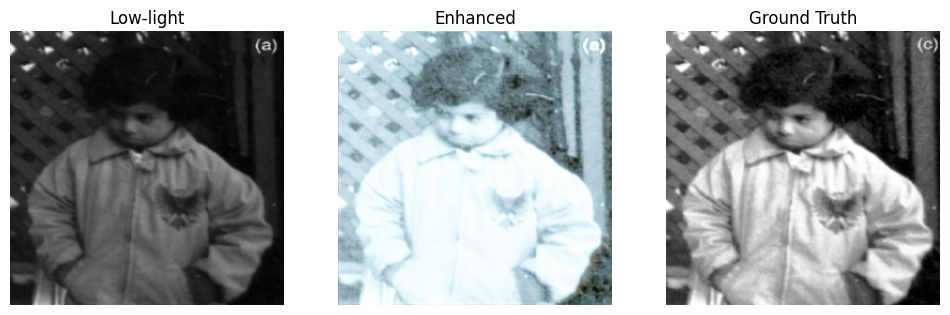

In [ ]:
from PIL import Image
import numpy as np

# Load using PIL and convert to RGB (drops alpha)
test_image_path = '/home/hp/Downloads/All_Old_Folders/CV/Projects/Enhanced_ELIEI/data_root/test/low/Test_1.png'
org_path = '/home/hp/Downloads/All_Old_Folders/CV/Projects/Enhanced_ELIEI/data_root/test/high/Test_1.png'

def load_rgb(path, target_size=(256,256)):
    img = Image.open(path).convert('RGB')             # <- ensures 3 channels
    img = img.resize(target_size)                     # if your load_image used resizing
    arr = np.array(img).astype(np.float32) / 255.0    # normalize to [0,1] if your model expects that
    return arr

test_image = load_rgb(test_image_path)
org_img = load_rgb(org_path)

# Predict
test_image_expanded = np.expand_dims(test_image, axis=0)
enhanced_image = model.predict(test_image_expanded)

# Visualize (requires matplotlib)
import matplotlib.pyplot as plt
plt.figure(figsize=(12,4))
plt.subplot(1,3,1); plt.title('Low-light'); plt.axis('off'); plt.imshow(test_image)
plt.subplot(1,3,2); plt.title('Enhanced'); plt.axis('off'); plt.imshow(np.squeeze(enhanced_image))
plt.subplot(1,3,3); plt.title('Ground Truth'); plt.axis('off'); plt.imshow(org_img)
plt.show()


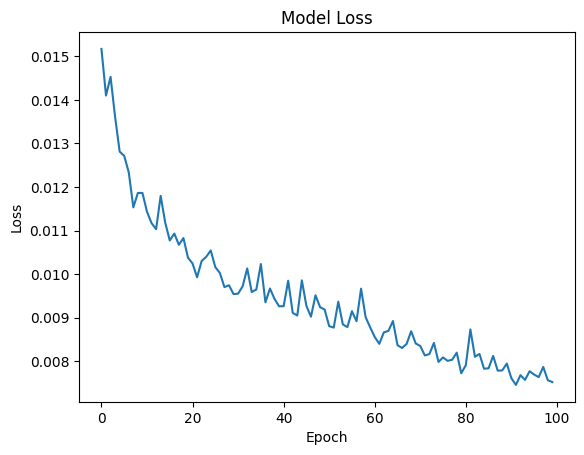

In [15]:
# Plot training loss
plt.plot(history.history['loss'])
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.show()

In [5]:
# Step 2: Reload dataset + rebuild your current U-Net model (base version)

import os
import numpy as np
import tensorflow as tf
from tensorflow.keras import layers, Model
from PIL import Image

# ==== Helper: load image safely (always RGB, normalized) ====
def load_image(image_path, size=(256, 256)):
    img = Image.open(image_path).convert('RGB')
    img = img.resize(size)
    img = np.array(img).astype(np.float32) / 255.0
    return img

# ==== Define training directories ====
train_low_dir = "/home/hp/Downloads/All_Old_Folders/CV/Projects/Enhanced_ELIEI/data_root/train/low"
train_high_dir = "/home/hp/Downloads/All_Old_Folders/CV/Projects/Enhanced_ELIEI/data_root/train/high"

# ==== Load training images ====
low_light_images, enhanced_images = [], []
for img_name in os.listdir(train_low_dir):
    low_path = os.path.join(train_low_dir, img_name)
    high_path = os.path.join(train_high_dir, img_name)
    if os.path.exists(high_path):
        low_light_images.append(load_image(low_path))
        enhanced_images.append(load_image(high_path))

low_light_array = np.array(low_light_images, dtype=np.float32)
enhanced_array = np.array(enhanced_images, dtype=np.float32)

print(f"Loaded training data: {low_light_array.shape}, {enhanced_array.shape}")

# ==== Define Base U-Net ====
def unet_model(input_shape=(256, 256, 3)):
    inputs = layers.Input(input_shape)
    
    # Encoder
    c1 = layers.Conv2D(64, 3, activation='relu', padding='same')(inputs)
    p1 = layers.MaxPooling2D((2, 2))(c1)
    
    c2 = layers.Conv2D(128, 3, activation='relu', padding='same')(p1)
    p2 = layers.MaxPooling2D((2, 2))(c2)
    
    # Bottleneck
    b = layers.Conv2D(256, 3, activation='relu', padding='same')(p2)
    
    # Decoder
    u2 = layers.Conv2DTranspose(128, 2, strides=2, padding='same')(b)
    concat2 = layers.concatenate([u2, c2])
    c3 = layers.Conv2D(128, 3, activation='relu', padding='same')(concat2)
    
    u1 = layers.Conv2DTranspose(64, 2, strides=2, padding='same')(c3)
    concat1 = layers.concatenate([u1, c1])
    c4 = layers.Conv2D(64, 3, activation='relu', padding='same')(concat1)
    
    outputs = layers.Conv2D(3, 1, activation='sigmoid')(c4)
    return Model(inputs, outputs)

# ==== Instantiate Model ====
model = unet_model()
model.summary()
print("\n✅ Base U-Net model and dataset ready.")


Loaded training data: (236, 256, 256, 3), (236, 256, 256, 3)


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_6 (Conv2D)   │ (None, 256, 256,  │      1,792 │ input_layer_1[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_2     │ (None, 128, 128,  │          0 │ conv2d_6[0][0]    │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_7 (Conv2D)   │ (None, 128, 128,  │     73,856 │ max_pooling2d_2[… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_3     │ (None, 64, 64,    │          0 │ conv2d_7[0][0]    │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_8 (Conv2D)   │ (None, 64, 64,    │    295,168 │ max_pooling2d_3[… │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_transpose_2  │ (None, 128, 128,  │    131,200 │ conv2d_8[0][0]    │
│ (Conv2DTranspose)   │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_2       │ (None, 128, 128,  │          0 │ conv2d_transpose… │
│ (Concatenate)       │ 256)              │            │ conv2d_7[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_9 (Conv2D)   │ (None, 128, 128,  │    295,040 │ concatenate_2[0]… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_transpose_3  │ (None, 256, 256,  │     32,832 │ conv2d_9[0][0]    │
│ (Conv2DTranspose)   │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_3       │ (None, 256, 256,  │          0 │ conv2d_transpose… │
│ (Concatenate)       │ 128)              │            │ conv2d_6[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_10 (Conv2D)  │ (None, 256, 256,  │     73,792 │ concatenate_3[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_11 (Conv2D)  │ (None, 256, 256,  │        195 │ conv2d_10[0][0]   │
│                     │ 3)                │            │                   │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 903,875 (3.45 MB)

 Trainable params: 903,875 (3.45 MB)

 Non-trainable params: 0 (0.00 B)


✅ Base U-Net model and dataset ready.


In [6]:
# Step 3: build VGG feature extractor + perceptual_loss and run sanity checks

import tensorflow as tf
from tensorflow.keras.applications import VGG19
from tensorflow.keras.models import Model
from tensorflow.keras.applications.vgg19 import preprocess_input as vgg_preprocess
import numpy as np

print("Building VGG19 feature extractor...")

feature_layer_names = ['block2_conv2', 'block3_conv4']
base_vgg = VGG19(include_top=False, weights='imagenet')
base_vgg.trainable = False

# Create extractor
feat_outputs = [base_vgg.get_layer(name).output for name in feature_layer_names]
vgg_feat_extractor = Model(inputs=base_vgg.input, outputs=feat_outputs)
vgg_feat_extractor.trainable = False
print("VGG built. Feature layers:", feature_layer_names)

# Perceptual loss (expects y_true,y_pred in [0,1])
@tf.function
def perceptual_loss(y_true, y_pred):
    y_true = tf.clip_by_value(y_true, 0.0, 1.0)
    y_pred = tf.clip_by_value(y_pred, 0.0, 1.0)
    # Convert to VGG expected format
    y_true_vgg = vgg_preprocess(y_true * 255.0)
    y_pred_vgg = vgg_preprocess(y_pred * 255.0)
    feats_true = vgg_feat_extractor(y_true_vgg)
    feats_pred = vgg_feat_extractor(y_pred_vgg)
    if not isinstance(feats_true, (list, tuple)):
        feats_true = [feats_true]; feats_pred = [feats_pred]
    loss = 0.0
    for ft, fp in zip(feats_true, feats_pred):
        loss += tf.reduce_mean(tf.square(ft - fp))
    loss = loss / float(len(feats_true))
    return loss

print("Perceptual loss function created.")

# --- Sanity checks ---
# Dummy
dummy_a = tf.random.uniform((1,256,256,3), 0.0, 1.0)
dummy_b = tf.random.uniform((1,256,256,3), 0.0, 1.0)
dloss = perceptual_loss(dummy_a, dummy_b).numpy()
print("Dummy perceptual loss (random):", float(dloss))

# Real pair (if available from step 2)
if 'low_light_array' in globals() and 'enhanced_array' in globals() and low_light_array.shape[0] > 0:
    y_in = tf.convert_to_tensor(enhanced_array[0:1], dtype=tf.float32)  # ground truth
    y_pred_input = tf.convert_to_tensor(low_light_array[0:1], dtype=tf.float32)  # input (as example)
    real_loss = perceptual_loss(y_in, y_pred_input).numpy()
    print("Perceptual loss (real pair, gt vs input):", float(real_loss))
else:
    print("No training arrays found for real-image perceptual test.")


Building VGG19 feature extractor...
80134624/80134624 ━━━━━━━━━━━━━━━━━━━━ 7s 0us/step
VGG built. Feature layers: ['block2_conv2', 'block3_conv4']
Perceptual loss function created.


2025-11-07 18:58:53.922094: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:473] Loaded cuDNN version 91500


Dummy perceptual loss (random): 208961.625
Perceptual loss (real pair, gt vs input): 184050.875


In [7]:
# Step 4: integrate perceptual loss into the combined loss and recompile the model

from tensorflow.image import psnr, ssim
from functools import partial

# --- Safe metrics ---
def ssim_metric(y_true, y_pred):
    y_true = tf.clip_by_value(y_true, 0.0, 1.0)
    y_pred = tf.clip_by_value(y_pred, 0.0, 1.0)
    return tf.reduce_mean(tf.image.ssim(y_true, y_pred, max_val=1.0))

wrapped_psnr = partial(psnr, max_val=1.0)

# --- Color Alignment Loss (CAL) ---
def color_alignment_loss(y_true, y_pred):
    mean_true = tf.reduce_mean(y_true, axis=[1,2])
    mean_pred = tf.reduce_mean(y_pred, axis=[1,2])
    std_true = tf.math.reduce_std(y_true, axis=[1,2])
    std_pred = tf.math.reduce_std(y_pred, axis=[1,2])
    mean_diff = tf.reduce_mean(tf.square(mean_true - mean_pred))
    std_diff = tf.reduce_mean(tf.square(std_true - std_pred))
    return mean_diff + std_diff

# --- Combined loss (MSE + CAL + Perceptual) ---
def combined_loss(y_true, y_pred):
    mse_loss = tf.reduce_mean(tf.square(y_true - y_pred))
    cal_loss = color_alignment_loss(y_true, y_pred)
    p_loss = perceptual_loss(y_true, y_pred)
    # weights: adjust if needed later
    return mse_loss + 0.01 * cal_loss + 0.00001 * p_loss

# --- Compile model ---
model.compile(
    optimizer='adam',
    loss=combined_loss,
    metrics=['mse', wrapped_psnr, ssim_metric]
)

print("✅ Model recompiled with perceptual + color alignment loss.")


✅ Model recompiled with perceptual + color alignment loss.


In [8]:
# Step 5: Quick smoke test training to verify new loss works

print("Starting 1-epoch test training...")

history = model.fit(
    low_light_array, 
    enhanced_array,
    epochs=1,
    batch_size=4,
    verbose=1
)

print("\n✅ Smoke test completed successfully (if no error above).")


Starting 1-epoch test training...


2025-11-07 19:00:14.817195: I external/local_xla/xla/service/service.cc:163] XLA service 0x7d032c015ed0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2025-11-07 19:00:14.817253: I external/local_xla/xla/service/service.cc:171]   StreamExecutor device (0): NVIDIA GeForce RTX 4060, Compute Capability 8.9
2025-11-07 19:00:14.911453: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2025-11-07 19:00:14.995662: W tensorflow/compiler/tf2xla/kernels/assert_op.cc:39] Ignoring Assert operator PSNR/Assert/Assert
2025-11-07 19:00:14.996046: W tensorflow/compiler/tf2xla/kernels/assert_op.cc:39] Ignoring Assert operator PSNR/Assert_1/Assert
2025-11-07 19:00:14.996741: W tensorflow/compiler/tf2xla/kernels/assert_op.cc:39] Ignoring Assert operator SSIM/Assert/Assert
2025-11-07 19:00:14.996976: W tensorflow/compiler/tf2xla/kernels/assert_op.cc:39] Ignorin

 2/59 ━━━━━━━━━━━━━━━━━━━━ 4s 85ms/step - loss: 2.7314 - mse: 0.0624 - partial: 12.5531 - ssim_metric: 0.4818  

I0000 00:00:1762522227.063160 2757154 device_compiler.h:196] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


59/59 ━━━━━━━━━━━━━━━━━━━━ 19s 86ms/step - loss: 1.8090 - mse: 0.0691 - partial: 12.2997 - ssim_metric: 0.5592

✅ Smoke test completed successfully (if no error above).


In [12]:
# --- FIX for PSNR serialization issue ---

from tensorflow.image import psnr
from tensorflow.image import ssim

# Define safe PSNR wrapper
def psnr_metric(y_true, y_pred):
    y_true = tf.clip_by_value(y_true, 0.0, 1.0)
    y_pred = tf.clip_by_value(y_pred, 0.0, 1.0)
    return tf.reduce_mean(psnr(y_true, y_pred, max_val=1.0))

# Safe SSIM wrapper (already defined earlier but ensuring consistent version)
def ssim_metric(y_true, y_pred):
    y_true = tf.clip_by_value(y_true, 0.0, 1.0)
    y_pred = tf.clip_by_value(y_pred, 0.0, 1.0)
    return tf.reduce_mean(ssim(y_true, y_pred, max_val=1.0))

# Recompile model with safe metrics
model.compile(
    optimizer='adam',
    loss=combined_loss,
    metrics=['mse', psnr_metric, ssim_metric]
)

print("✅ Model recompiled with safe PSNR metric (no serialization issue).")


✅ Model recompiled with safe PSNR metric (no serialization issue).


In [13]:
# Step 6: Full multi-epoch training with model checkpoints and metric logging

import tensorflow as tf
from tensorflow.keras.callbacks import ModelCheckpoint, CSVLogger

# Directory to save models and logs
save_dir = "/home/hp/Downloads/All_Old_Folders/CV/Projects/Enhanced_ELIEI/training_runs"
os.makedirs(save_dir, exist_ok=True)

# --- Callbacks ---
checkpoint_path = os.path.join(save_dir, "best_model_perceptual.keras")
log_path = os.path.join(save_dir, "training_log.csv")

checkpoint_cb = ModelCheckpoint(
    filepath=checkpoint_path,
    monitor='loss',        # you can change to 'ssim_metric' to track SSIM improvement
    save_best_only=True,
    save_weights_only=False,
    mode='min',            # 'max' if using SSIM, 'min' for loss
    verbose=1
)

csv_logger = CSVLogger(log_path, append=True)

# --- Full Training ---
print("Starting full training (20 epochs)...")
history = model.fit(
    low_light_array,
    enhanced_array,
    epochs=20,
    batch_size=4,
    callbacks=[checkpoint_cb, csv_logger],
    verbose=1
)

print("\nFull training completed!")
print(f"Best model saved to: {checkpoint_path}")
print(f"Training log saved to: {log_path}")


Starting full training (20 epochs)...
Epoch 1/20


2025-11-07 19:05:30.790046: W tensorflow/compiler/tf2xla/kernels/assert_op.cc:39] Ignoring Assert operator PSNR/Assert/Assert
2025-11-07 19:05:30.790330: W tensorflow/compiler/tf2xla/kernels/assert_op.cc:39] Ignoring Assert operator PSNR/Assert_1/Assert
2025-11-07 19:05:30.791065: W tensorflow/compiler/tf2xla/kernels/assert_op.cc:39] Ignoring Assert operator SSIM/Assert/Assert
2025-11-07 19:05:30.791311: W tensorflow/compiler/tf2xla/kernels/assert_op.cc:39] Ignoring Assert operator SSIM/Assert_1/Assert
2025-11-07 19:05:30.791640: W tensorflow/compiler/tf2xla/kernels/assert_op.cc:39] Ignoring Assert operator SSIM/Assert_2/Assert
2025-11-07 19:05:30.791809: W tensorflow/compiler/tf2xla/kernels/assert_op.cc:39] Ignoring Assert operator SSIM/Assert_3/Assert


59/59 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 0.5666 - mse: 0.0137 - psnr_metric: 20.5822 - ssim_metric: 0.8131
Epoch 1: loss improved from None to 0.56860, saving model to /home/hp/Downloads/All_Old_Folders/CV/Projects/Enhanced_ELIEI/training_runs/best_model_perceptual.keras
59/59 ━━━━━━━━━━━━━━━━━━━━ 8s 86ms/step - loss: 0.5686 - mse: 0.0144 - psnr_metric: 20.7625 - ssim_metric: 0.8150
Epoch 2/20
59/59 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.5030 - mse: 0.0130 - psnr_metric: 21.5117 - ssim_metric: 0.8280
Epoch 2: loss improved from 0.56860 to 0.53224, saving model to /home/hp/Downloads/All_Old_Folders/CV/Projects/Enhanced_ELIEI/training_runs/best_model_perceptual.keras
59/59 ━━━━━━━━━━━━━━━━━━━━ 5s 87ms/step - loss: 0.5322 - mse: 0.0138 - psnr_metric: 21.3762 - ssim_metric: 0.8233
Epoch 3/20
59/59 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.5788 - mse: 0.0142 - psnr_metric: 21.0128 - ssim_metric: 0.8141
Epoch 3: loss improved from 0.53224 to 0.52141, saving model to /home/hp/Do

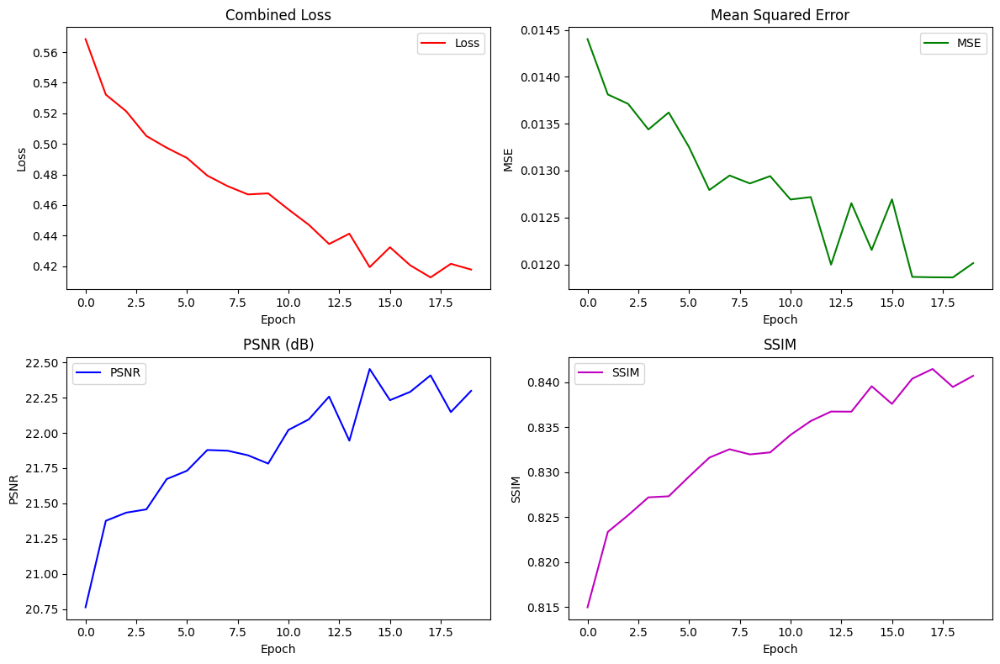

In [15]:
# Step 7: Plot training curves from CSV log
import pandas as pd
import matplotlib.pyplot as plt

log_path = "/home/hp/Downloads/All_Old_Folders/CV/Projects/Enhanced_ELIEI/training_runs/training_log.csv"
df = pd.read_csv(log_path)

plt.figure(figsize=(12,8))

plt.subplot(2,2,1)
plt.plot(df['epoch'], df['loss'], 'r-', label='Loss')
plt.title('Combined Loss'); plt.xlabel('Epoch'); plt.ylabel('Loss'); plt.legend()

plt.subplot(2,2,2)
plt.plot(df['epoch'], df['mse'], 'g-', label='MSE')
plt.title('Mean Squared Error'); plt.xlabel('Epoch'); plt.ylabel('MSE'); plt.legend()

plt.subplot(2,2,3)
plt.plot(df['epoch'], df['psnr_metric'], 'b-', label='PSNR')
plt.title('PSNR (dB)'); plt.xlabel('Epoch'); plt.ylabel('PSNR'); plt.legend()

plt.subplot(2,2,4)
plt.plot(df['epoch'], df['ssim_metric'], 'm-', label='SSIM')
plt.title('SSIM'); plt.xlabel('Epoch'); plt.ylabel('SSIM'); plt.legend()

plt.tight_layout()
plt.show()


In [23]:
# Step 8: Resume training from best checkpoint for another 30 epochs

from tensorflow.keras.models import load_model

# Load best saved model
best_model_path = "/home/hp/Downloads/All_Old_Folders/CV/Projects/Enhanced_ELIEI/training_runs/best_model_perceptual.keras"
model = load_model(best_model_path, compile=False)

# Recompile (important since we used custom losses)
model.compile(
    optimizer='adam',
    loss=combined_loss,
    metrics=['mse', psnr_metric, ssim_metric]
)

print("✅ Loaded best model and recompiled successfully.")

# Continue training
history2 = model.fit(
    low_light_array,
    enhanced_array,
    epochs=100,        # Train 30 more epochs
    batch_size=4,
    callbacks=[checkpoint_cb, csv_logger],
    verbose=1
)

print("\n🚀 Continued training complete!")


✅ Loaded best model and recompiled successfully.
Epoch 1/100
59/59 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 0.3677 - mse: 0.0113 - psnr_metric: 22.1210 - ssim_metric: 0.8403
Epoch 1: loss did not improve from 0.34992
59/59 ━━━━━━━━━━━━━━━━━━━━ 8s 85ms/step - loss: 0.3669 - mse: 0.0109 - psnr_metric: 22.5463 - ssim_metric: 0.8439
Epoch 2/100
59/59 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.3466 - mse: 0.0094 - psnr_metric: 23.0098 - ssim_metric: 0.8494
Epoch 2: loss improved from 0.34992 to 0.34844, saving model to /home/hp/Downloads/All_Old_Folders/CV/Projects/Enhanced_ELIEI/training_runs/best_model_perceptual.keras
59/59 ━━━━━━━━━━━━━━━━━━━━ 5s 87ms/step - loss: 0.3484 - mse: 0.0105 - psnr_metric: 22.7905 - ssim_metric: 0.8477
Epoch 3/100
59/59 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 0.3307 - mse: 0.0094 - psnr_metric: 23.1057 - ssim_metric: 0.8569
Epoch 3: loss did not improve from 0.34844
59/59 ━━━━━━━━━━━━━━━━━━━━ 5s 84ms/step - loss: 0.3553 - mse: 0.0107 - psnr_metric: 22.8016

Loaded best model and recompiled.
22/22 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step - loss: 0.3244 - mse: 0.0086 - psnr_metric: 23.2455 - ssim_metric: 0.8520

--- Evaluation Results on Eval Set ---
Loss (combined): 0.3244
MSE: 0.008586
PSNR: 23.25 dB
SSIM: 0.8520
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


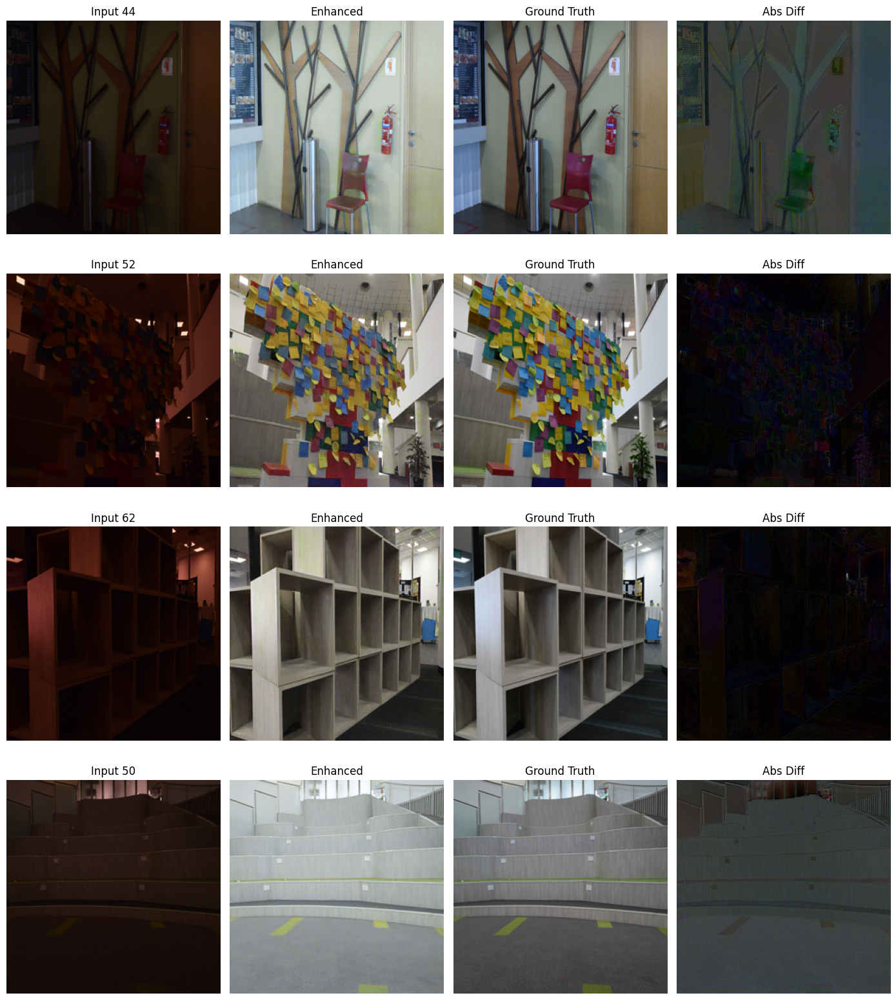

In [24]:
# Step 9: Evaluate best model on eval set and visualize samples

import os, random
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.models import load_model

best_model_path = "/home/hp/Downloads/All_Old_Folders/CV/Projects/Enhanced_ELIEI/training_runs/best_model_perceptual.keras"

# 1) load model (compile=False then compile with custom loss & metrics)
model = load_model(best_model_path, compile=False)

# Re-register custom objects by recompiling
model.compile(optimizer='adam', loss=combined_loss, metrics=['mse', psnr_metric, ssim_metric])
print("Loaded best model and recompiled.")

# 2) Ensure eval arrays are available; if not, try to load from eval folder
if 'eval_low_light_array' not in globals() or 'eval_enhanced_array' not in globals():
    print("Eval arrays not found in memory — attempting to load from disk...")
    eval_low_dir = "/home/hp/Downloads/All_Old_Folders/CV/Projects/Enhanced_ELIEI/data_root/eval/low"
    eval_high_dir = "/home/hp/Downloads/All_Old_Folders/CV/Projects/Enhanced_ELIEI/data_root/eval/high"
    ev_low, ev_high = [], []
    from PIL import Image
    def load_rgb(path, size=(256,256)):
        img = Image.open(path).convert('RGB').resize(size)
        return np.array(img).astype(np.float32) / 255.0
    names = sorted(os.listdir(eval_low_dir))
    for n in names:
        p1 = os.path.join(eval_low_dir, n)
        p2 = os.path.join(eval_high_dir, n)
        if os.path.exists(p2):
            ev_low.append(load_rgb(p1))
            ev_high.append(load_rgb(p2))
    eval_low_light_array = np.array(ev_low, dtype=np.float32)
    eval_enhanced_array = np.array(ev_high, dtype=np.float32)
    print(f"Loaded eval pairs: {len(eval_low_light_array)}")

# 3) Evaluate metrics
results = model.evaluate(eval_low_light_array, eval_enhanced_array, batch_size=4, verbose=1)
print("\n--- Evaluation Results on Eval Set ---")
print(f"Loss (combined): {results[0]:.4f}")
print(f"MSE: {results[1]:.6f}")
print(f"PSNR: {results[2]:.2f} dB")
print(f"SSIM: {results[3]:.4f}")

# 4) Visualize 4 random examples (input / enhanced / gt / abs diff)
n_samples = min(4, len(eval_low_light_array))
indices = random.sample(range(len(eval_low_light_array)), n_samples)

plt.figure(figsize=(14, 4 * n_samples))
for i, idx in enumerate(indices):
    inp = eval_low_light_array[idx:idx+1]
    gt  = eval_enhanced_array[idx:idx+1]
    pred = model.predict(inp)
    inp = inp[0]; gt = gt[0]; pred = pred[0]
    diff = np.clip(np.abs(pred - gt), 0.0, 1.0)

    plt.subplot(n_samples, 4, i*4 + 1)
    plt.title(f"Input {idx}")
    plt.axis('off'); plt.imshow(inp)

    plt.subplot(n_samples, 4, i*4 + 2)
    plt.title("Enhanced")
    plt.axis('off'); plt.imshow(pred)

    plt.subplot(n_samples, 4, i*4 + 3)
    plt.title("Ground Truth")
    plt.axis('off'); plt.imshow(gt)

    plt.subplot(n_samples, 4, i*4 + 4)
    plt.title("Abs Diff")
    plt.axis('off'); plt.imshow(diff)

plt.tight_layout()
plt.show()


In [18]:
# Tiny experiment: change perceptual weight and run 5 epochs
# (Make sure you have a backup copy of your current best model if you want to revert)

import tensorflow as tf
from tensorflow.keras.models import load_model
import os

# 1) load best model (start from best checkpoint)
best_model_path = "/home/hp/Downloads/All_Old_Folders/CV/Projects/Enhanced_ELIEI/training_runs/best_model_perceptual.keras"
model = load_model(best_model_path, compile=False)

# 2) redefine combined loss with increased perceptual weight
def combined_loss_lambda1e4(y_true, y_pred):
    mse_loss = tf.reduce_mean(tf.square(y_true - y_pred))
    cal_loss = color_alignment_loss(y_true, y_pred)    # uses the function already in your session
    p_loss = perceptual_loss(y_true, y_pred)           # uses VGG extractor already in your session
    return mse_loss + 0.01 * cal_loss + 0.0001 * p_loss  # perceptual weight = 1e-4

# 3) recompile with safe metrics
model.compile(optimizer='adam',
              loss=combined_loss_lambda1e4,
              metrics=['mse', psnr_metric, ssim_metric])

print("Model recompiled with perceptual weight = 1e-4")

# 4) quick training: 5 epochs only (small, fast)
history_exp = model.fit(
    low_light_array,
    enhanced_array,
    epochs=5,
    batch_size=4,
    verbose=1
)

# 5) evaluate on eval set quickly
results = model.evaluate(eval_low_light_array, eval_enhanced_array, batch_size=4, verbose=1)
print("\nEvaluation after λ=1e-4 (5 epochs):")
print(f"Loss: {results[0]:.4f}, MSE: {results[1]:.6f}, PSNR: {results[2]:.2f} dB, SSIM: {results[3]:.4f}")

# 6) Save this experiment model with timestamp so we don't overwrite the best model
import datetime
ts = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")
save_path = f"/home/hp/Downloads/All_Old_Folders/CV/Projects/Enhanced_ELIEI/training_runs/exp_lambda1e4_{ts}.keras"
model.save(save_path)
print("Saved experiment model to:", save_path)


Model recompiled with perceptual weight = 1e-4
Epoch 1/5
59/59 ━━━━━━━━━━━━━━━━━━━━ 8s 86ms/step - loss: 3.5465 - mse: 0.0111 - psnr_metric: 22.6610 - ssim_metric: 0.8452
Epoch 2/5
59/59 ━━━━━━━━━━━━━━━━━━━━ 5s 86ms/step - loss: 3.4262 - mse: 0.0109 - psnr_metric: 22.7926 - ssim_metric: 0.8475
Epoch 3/5
59/59 ━━━━━━━━━━━━━━━━━━━━ 5s 86ms/step - loss: 3.3835 - mse: 0.0105 - psnr_metric: 22.9038 - ssim_metric: 0.8474
Epoch 4/5
59/59 ━━━━━━━━━━━━━━━━━━━━ 5s 85ms/step - loss: 3.4032 - mse: 0.0108 - psnr_metric: 22.9008 - ssim_metric: 0.8458
Epoch 5/5
59/59 ━━━━━━━━━━━━━━━━━━━━ 5s 85ms/step - loss: 3.4150 - mse: 0.0107 - psnr_metric: 22.8779 - ssim_metric: 0.8471
22/22 ━━━━━━━━━━━━━━━━━━━━ 2s 63ms/step - loss: 3.3310 - mse: 0.0100 - psnr_metric: 22.9741 - ssim_metric: 0.8572

Evaluation after λ=1e-4 (5 epochs):
Loss: 3.3310, MSE: 0.010046, PSNR: 22.97 dB, SSIM: 0.8572
Saved experiment model to: /home/hp/Downloads/All_Old_Folders/CV/Projects/Enhanced_ELIEI/training_runs/exp_lambda1e4_2025110

In [19]:
# Tiny step: normalized perceptual loss (divide each layer MSE by number of elements)
import tensorflow as tf
from tensorflow.keras.models import load_model
import datetime, os

# 1) redefine normalized perceptual loss
@tf.function
def perceptual_loss_normalized(y_true, y_pred):
    y_true = tf.clip_by_value(y_true, 0.0, 1.0)
    y_pred = tf.clip_by_value(y_pred, 0.0, 1.0)
    y_true_vgg = vgg_preprocess(y_true * 255.0)
    y_pred_vgg = vgg_preprocess(y_pred * 255.0)
    feats_true = vgg_feat_extractor(y_true_vgg)
    feats_pred = vgg_feat_extractor(y_pred_vgg)
    if not isinstance(feats_true, (list, tuple)):
        feats_true = [feats_true]; feats_pred = [feats_pred]

    total = 0.0
    for ft, fp in zip(feats_true, feats_pred):
        diff = ft - fp
        # normalize by number of elements in this feature tensor
        n = tf.cast(tf.size(diff), tf.float32)
        total += tf.reduce_sum(tf.square(diff)) / (n + 1e-12)
    return total / float(len(feats_true))

# 2) define a new combined loss using the normalized perceptual term
def combined_loss_norm(y_true, y_pred):
    mse_loss = tf.reduce_mean(tf.square(y_true - y_pred))
    cal_loss = color_alignment_loss(y_true, y_pred)
    p_loss = perceptual_loss_normalized(y_true, y_pred)
    # use a modest perceptual weight (try 1e-3 or 1e-4 later). Start with 1e-3 here.
    return mse_loss + 0.01 * cal_loss + 1e-3 * p_loss

# 3) load best model and recompile
best_model_path = "/home/hp/Downloads/All_Old_Folders/CV/Projects/Enhanced_ELIEI/training_runs/best_model_perceptual.keras"
model = load_model(best_model_path, compile=False)
model.compile(optimizer='adam', loss=combined_loss_norm, metrics=['mse', psnr_metric, ssim_metric])
print("Recompiled with normalized perceptual loss and λ=1e-3 (temporary test).")

# 4) run a short 1-epoch smoke test (or change to 3-5 epochs if you want)
hist = model.fit(low_light_array, enhanced_array, epochs=1, batch_size=4, verbose=1)

# 5) evaluate on eval set
res = model.evaluate(eval_low_light_array, eval_enhanced_array, batch_size=4, verbose=1)
print("Eval after normalized-perceptual test -> Loss: %.4f  MSE: %.6f  PSNR: %.2f  SSIM: %.4f" % (res[0], res[1], res[2], res[3]))

# 6) save this experiment model separately
ts = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")
save_path = f"/home/hp/Downloads/All_Old_Folders/CV/Projects/Enhanced_ELIEI/training_runs/exp_perc_norm_{ts}.keras"
model.save(save_path)
print("Saved experiment model to:", save_path)


Recompiled with normalized perceptual loss and λ=1e-3 (temporary test).
59/59 ━━━━━━━━━━━━━━━━━━━━ 8s 85ms/step - loss: 36.0162 - mse: 0.0112 - psnr_metric: 22.5031 - ssim_metric: 0.8430
22/22 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step - loss: 33.2814 - mse: 0.0117 - psnr_metric: 22.4706 - ssim_metric: 0.8568
Eval after normalized-perceptual test -> Loss: 33.2814  MSE: 0.011743  PSNR: 22.47  SSIM: 0.8568
Saved experiment model to: /home/hp/Downloads/All_Old_Folders/CV/Projects/Enhanced_ELIEI/training_runs/exp_perc_norm_20251107_194814.keras


In [20]:
# Tiny experiment: normalized perceptual loss with lambda = 5e-4 (5 epochs)
import tensorflow as tf, datetime, os
from tensorflow.keras.models import load_model

best_model_path = "/home/hp/Downloads/All_Old_Folders/CV/Projects/Enhanced_ELIEI/training_runs/best_model_perceptual.keras"
model = load_model(best_model_path, compile=False)

# normalized perceptual loss (re-use perceptual_loss_normalized if in scope)
@tf.function
def perceptual_loss_normalized_local(y_true, y_pred):
    y_true = tf.clip_by_value(y_true, 0.0, 1.0)
    y_pred = tf.clip_by_value(y_pred, 0.0, 1.0)
    y_true_vgg = vgg_preprocess(y_true * 255.0)
    y_pred_vgg = vgg_preprocess(y_pred * 255.0)
    feats_true = vgg_feat_extractor(y_true_vgg)
    feats_pred = vgg_feat_extractor(y_pred_vgg)
    if not isinstance(feats_true, (list, tuple)):
        feats_true = [feats_true]; feats_pred = [feats_pred]
    total = 0.0
    for ft, fp in zip(feats_true, feats_pred):
        diff = ft - fp
        n = tf.cast(tf.size(diff), tf.float32)
        total += tf.reduce_sum(tf.square(diff)) / (n + 1e-12)
    return total / float(len(feats_true))

def combined_loss_norm_lambda(y_true, y_pred):
    mse_loss = tf.reduce_mean(tf.square(y_true - y_pred))
    cal_loss = color_alignment_loss(y_true, y_pred)
    p_loss = perceptual_loss_normalized_local(y_true, y_pred)
    return mse_loss + 0.01 * cal_loss + 5e-4 * p_loss

model.compile(optimizer='adam', loss=combined_loss_norm_lambda, metrics=['mse', psnr_metric, ssim_metric])
print("Recompiled with normalized perceptual loss and λ=5e-4 (test).")

# Train 5 epochs
hist = model.fit(low_light_array, enhanced_array, epochs=5, batch_size=4, verbose=1)

# Evaluate
res = model.evaluate(eval_low_light_array, eval_enhanced_array, batch_size=4, verbose=1)
print("Eval after λ=5e-4 (5 epochs): Loss: %.4f  MSE: %.6f  PSNR: %.2f  SSIM: %.4f" % (res[0], res[1], res[2], res[3]))

# Save experiment model
ts = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")
save_path = f"/home/hp/Downloads/All_Old_Folders/CV/Projects/Enhanced_ELIEI/training_runs/exp_perc_norm_l5e4_{ts}.keras"
model.save(save_path)
print("Saved experiment model to:", save_path)


Recompiled with normalized perceptual loss and λ=5e-4 (test).
Epoch 1/5
59/59 ━━━━━━━━━━━━━━━━━━━━ 8s 86ms/step - loss: 17.6606 - mse: 0.0111 - psnr_metric: 22.5587 - ssim_metric: 0.8439
Epoch 2/5
59/59 ━━━━━━━━━━━━━━━━━━━━ 5s 86ms/step - loss: 16.7219 - mse: 0.0107 - psnr_metric: 22.9049 - ssim_metric: 0.8475
Epoch 3/5
59/59 ━━━━━━━━━━━━━━━━━━━━ 5s 86ms/step - loss: 17.9799 - mse: 0.0111 - psnr_metric: 22.7679 - ssim_metric: 0.8437
Epoch 4/5
59/59 ━━━━━━━━━━━━━━━━━━━━ 5s 86ms/step - loss: 16.8224 - mse: 0.0108 - psnr_metric: 22.7592 - ssim_metric: 0.8465
Epoch 5/5
59/59 ━━━━━━━━━━━━━━━━━━━━ 5s 87ms/step - loss: 17.2561 - mse: 0.0110 - psnr_metric: 22.7316 - ssim_metric: 0.8453
22/22 ━━━━━━━━━━━━━━━━━━━━ 2s 62ms/step - loss: 16.8204 - mse: 0.0121 - psnr_metric: 22.4865 - ssim_metric: 0.8527
Eval after λ=5e-4 (5 epochs): Loss: 16.8204  MSE: 0.012087  PSNR: 22.49  SSIM: 0.8527
Saved experiment model to: /home/hp/Downloads/All_Old_Folders/CV/Projects/Enhanced_ELIEI/training_runs/exp_perc_

In [34]:
# Evaluate all .keras models in training_runs and save per-model metrics + sample visuals
import os, glob, random, numpy as np, tensorflow as tf
from tensorflow.keras.models import load_model
from PIL import Image
import matplotlib.pyplot as plt
import csv

# Paths - adjust if your runs folder is different
runs_dir = "/home/hp/Downloads/All_Old_Folders/CV/Projects/Enhanced_ELIEI/training_runs"
eval_low_dir = "/home/hp/Downloads/All_Old_Folders/CV/Projects/Enhanced_ELIEI/data_root/eval/low"
eval_high_dir = "/home/hp/Downloads/All_Old_Folders/CV/Projects/Enhanced_ELIEI/data_root/eval/high"
out_dir = os.path.join(runs_dir, "model_comparisons")
os.makedirs(out_dir, exist_ok=True)

# Find eval files (matching names)
eval_names = sorted([f for f in os.listdir(eval_low_dir) if os.path.isfile(os.path.join(eval_low_dir, f))])
# load eval arrays (normalized [0,1])
def load_rgb(path, size=(256,256)):
    img = Image.open(path).convert('RGB').resize(size)
    return np.array(img).astype(np.float32) / 255.0

X_eval = []
Y_eval = []
names = []
for n in eval_names:
    p1 = os.path.join(eval_low_dir, n)
    p2 = os.path.join(eval_high_dir, n)
    if os.path.exists(p2):
        X_eval.append(load_rgb(p1))
        Y_eval.append(load_rgb(p2))
        names.append(n)
X_eval = np.array(X_eval, dtype=np.float32)
Y_eval = np.array(Y_eval, dtype=np.float32)
print(f"Loaded {len(X_eval)} eval pairs.")

# Get model files
model_files = sorted(glob.glob(os.path.join(runs_dir, "*.keras")))
if len(model_files) == 0:
    # also search recursively
    model_files = sorted(glob.glob(os.path.join(runs_dir, "**", "*.keras"), recursive=True))

print("Found model files:", model_files)

# Helper metric functions
def mse_numpy(a,b):
    return float(np.mean((a - b)**2))

def psnr_numpy(a,b):
    # use TF for PSNR/SSIM (handles dynamic range)
    return float(tf.reduce_mean(tf.image.psnr(a, b, max_val=1.0)).numpy())

def ssim_numpy(a,b):
    return float(tf.reduce_mean(tf.image.ssim(a, b, max_val=1.0)).numpy())

# CSV results
csv_path = os.path.join(out_dir, "model_eval_summary.csv")
with open(csv_path, "w", newline="") as csvfile:
    writer = csv.writer(csvfile)
    writer.writerow(["model_file", "num_eval", "mse", "psnr_db", "ssim"])
    for mf in model_files:
        try:
            print("Evaluating model:", mf)
            model = load_model(mf, compile=False)  # load without compiling
            # predict in batches to avoid OOM
            preds = model.predict(X_eval, batch_size=4, verbose=0)
            preds = np.clip(preds, 0.0, 1.0)
            # compute metrics
            mse_val = mse_numpy(preds, Y_eval)
            psnr_val = psnr_numpy(preds, Y_eval)
            ssim_val = ssim_numpy(preds, Y_eval)
            writer.writerow([mf, len(X_eval), mse_val, psnr_val, ssim_val])
            print(f" -> MSE={mse_val:.6f}, PSNR={psnr_val:.2f} dB, SSIM={ssim_val:.4f}")
            
            # Save 4 example visual comparisons per model
            sample_idxs = random.sample(range(len(X_eval)), min(4, len(X_eval)))
            model_out_dir = os.path.join(out_dir, os.path.splitext(os.path.basename(mf))[0])
            os.makedirs(model_out_dir, exist_ok=True)
            for i, idx in enumerate(sample_idxs):
                inp = X_eval[idx]
                gt = Y_eval[idx]
                pred = preds[idx]
                diff = np.clip(np.abs(pred - gt), 0.0, 1.0)
                # create a wide concatenated image (input | pred | gt | diff)
                concat = np.concatenate([
                    (inp * 255).astype(np.uint8),
                    (pred * 255).astype(np.uint8),
                    (gt * 255).astype(np.uint8),
                    (diff * 255).astype(np.uint8),
                ], axis=1)
                im = Image.fromarray(concat)
                out_path = os.path.join(model_out_dir, f"sample_{i}_idx{idx}.png")
                im.save(out_path)
            print(" -> Saved sample comparisons to:", model_out_dir)
        except Exception as e:
            print("Error evaluating", mf, ":", e)

print("Summary CSV saved to:", csv_path)
print("All done — open the CSV to pick the best model and look at saved sample images.")


Loaded 87 eval pairs.
Found model files: ['/home/hp/Downloads/All_Old_Folders/CV/Projects/Enhanced_ELIEI/training_runs/best_model_perceptual.keras', '/home/hp/Downloads/All_Old_Folders/CV/Projects/Enhanced_ELIEI/training_runs/exp_lambda1e4_20251107_191941.keras', '/home/hp/Downloads/All_Old_Folders/CV/Projects/Enhanced_ELIEI/training_runs/exp_perc_norm_20251107_194814.keras', '/home/hp/Downloads/All_Old_Folders/CV/Projects/Enhanced_ELIEI/training_runs/exp_perc_norm_l5e4_20251107_195113.keras', '/home/hp/Downloads/All_Old_Folders/CV/Projects/Enhanced_ELIEI/training_runs/original_baseline_model.keras']
Evaluating model: /home/hp/Downloads/All_Old_Folders/CV/Projects/Enhanced_ELIEI/training_runs/best_model_perceptual.keras
 -> MSE=0.008586, PSNR=23.24 dB, SSIM=0.8521
 -> Saved sample comparisons to: /home/hp/Downloads/All_Old_Folders/CV/Projects/Enhanced_ELIEI/training_runs/model_comparisons/best_model_perceptual
Evaluating model: /home/hp/Downloads/All_Old_Folders/CV/Projects/Enhanced_EL

Example: 137.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


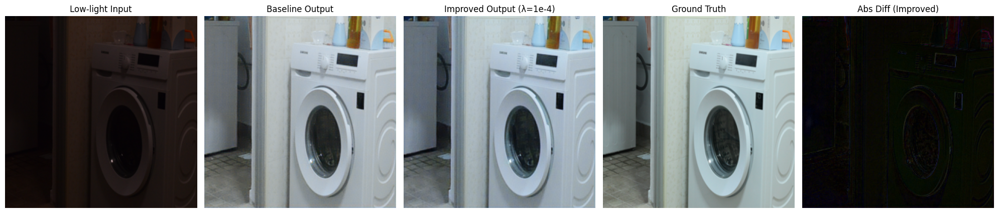

Saved figure to: /home/hp/Downloads/All_Old_Folders/CV/Projects/Enhanced_ELIEI/training_runs/final_comparison.png


In [26]:
import numpy as np, matplotlib.pyplot as plt
from tensorflow.keras.models import load_model
from PIL import Image
import os

# Paths to models
baseline_path = "/home/hp/Downloads/All_Old_Folders/CV/Projects/Enhanced_ELIEI/training_runs/best_model_perceptual.keras"
improved_path = "/home/hp/Downloads/All_Old_Folders/CV/Projects/Enhanced_ELIEI/training_runs/exp_lambda1e4_20251107_191941.keras"

# Load models
baseline = load_model(baseline_path, compile=False)
improved = load_model(improved_path, compile=False)

# Pick one example from eval set
sample_idx = 10  # you can change 0–86
eval_low_dir = "/home/hp/Downloads/All_Old_Folders/CV/Projects/Enhanced_ELIEI/data_root/eval/low"
eval_high_dir = "/home/hp/Downloads/All_Old_Folders/CV/Projects/Enhanced_ELIEI/data_root/eval/high"
eval_files = sorted(os.listdir(eval_low_dir))
img_name = eval_files[sample_idx]
print("Example:", img_name)

def load_rgb(path, size=(256,256)):
    img = Image.open(path).convert('RGB').resize(size)
    return np.array(img).astype(np.float32)/255.0

inp = load_rgb(os.path.join(eval_low_dir, img_name))
gt = load_rgb(os.path.join(eval_high_dir, img_name))

inp_batch = np.expand_dims(inp, 0)
out_base = np.clip(baseline.predict(inp_batch)[0], 0, 1)
out_impr = np.clip(improved.predict(inp_batch)[0], 0, 1)

diff_base = np.abs(gt - out_base)
diff_impr = np.abs(gt - out_impr)

# Visualize
fig, axes = plt.subplots(1, 5, figsize=(20, 5))
titles = ["Low-light Input", "Baseline Output", "Improved Output (λ=1e-4)", "Ground Truth", "Abs Diff (Improved)"]
images = [inp, out_base, out_impr, gt, diff_impr]
for ax, img, title in zip(axes, images, titles):
    ax.imshow(img)
    ax.set_title(title, fontsize=12)
    ax.axis('off')

plt.tight_layout()
out_path = "/home/hp/Downloads/All_Old_Folders/CV/Projects/Enhanced_ELIEI/training_runs/final_comparison.png"
plt.savefig(out_path, dpi=200)
plt.show()

print("Saved figure to:", out_path)


Example: 137.png
Loading Baseline (No VGG)...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step
Loading best_model_perceptual...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step
Loading exp_lambda1e4...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step
Loading exp_perc_norm...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step
Loading exp_perc_norm_l5e4...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


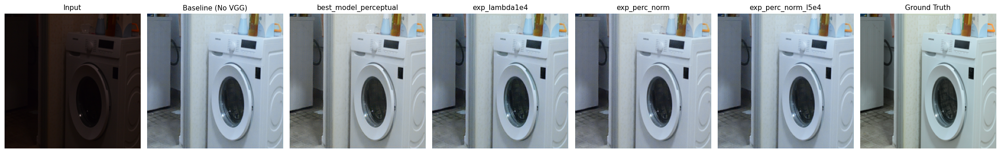

✅ Saved visual comparison to: /home/hp/Downloads/All_Old_Folders/CV/Projects/Enhanced_ELIEI/training_runs/final_visual_comparison_all5.png


In [33]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model
from PIL import Image
import os

# --- Define model paths ---
model_paths = {
    "Baseline (No VGG)": "/home/hp/Downloads/All_Old_Folders/CV/Projects/Enhanced_ELIEI/training_runs/original_baseline_model.keras",   # <--- your simple model
    "best_model_perceptual": "/home/hp/Downloads/All_Old_Folders/CV/Projects/Enhanced_ELIEI/training_runs/best_model_perceptual.keras",
    "exp_lambda1e4": "/home/hp/Downloads/All_Old_Folders/CV/Projects/Enhanced_ELIEI/training_runs/exp_lambda1e4_20251107_191941.keras",
    "exp_perc_norm": "/home/hp/Downloads/All_Old_Folders/CV/Projects/Enhanced_ELIEI/training_runs/exp_perc_norm_20251107_194814.keras",
    "exp_perc_norm_l5e4": "/home/hp/Downloads/All_Old_Folders/CV/Projects/Enhanced_ELIEI/training_runs/exp_perc_norm_l5e4_20251107_195113.keras"
}

# --- Pick sample image ---
sample_idx = 10  # Change this to see different samples
eval_low_dir = "/home/hp/Downloads/All_Old_Folders/CV/Projects/Enhanced_ELIEI/data_root/eval/low"
eval_high_dir = "/home/hp/Downloads/All_Old_Folders/CV/Projects/Enhanced_ELIEI/data_root/eval/high"

files = sorted(os.listdir(eval_low_dir))
img_name = files[sample_idx]
print(f"Example: {img_name}")

def load_rgb(path, size=(256, 256)):
    img = Image.open(path).convert("RGB").resize(size)
    return np.array(img).astype(np.float32) / 255.0

inp = load_rgb(os.path.join(eval_low_dir, img_name))
gt = load_rgb(os.path.join(eval_high_dir, img_name))
inp_batch = np.expand_dims(inp, 0)

# --- Predict with all models ---
outputs = {}
for label, path in model_paths.items():
    print(f"Loading {label}...")
    model = load_model(path, compile=False)
    pred = np.clip(model.predict(inp_batch)[0], 0, 1)
    outputs[label] = pred

# --- Plot all results ---
fig, axes = plt.subplots(1, len(outputs) + 2, figsize=(22, 6))
titles = ["Input"] + list(outputs.keys()) + ["Ground Truth"]
images = [inp] + list(outputs.values()) + [gt]

for ax, img, title in zip(axes, images, titles):
    ax.imshow(img)
    ax.set_title(title, fontsize=11)
    ax.axis("off")

plt.tight_layout()
save_path = "/home/hp/Downloads/All_Old_Folders/CV/Projects/Enhanced_ELIEI/training_runs/final_visual_comparison_all5.png"
plt.savefig(save_path, dpi=300)
plt.show()

print(f"✅ Saved visual comparison to: {save_path}")


Loaded 87 eval images.
Models found: ['/home/hp/Downloads/All_Old_Folders/CV/Projects/Enhanced_ELIEI/training_runs/best_model_perceptual.keras', '/home/hp/Downloads/All_Old_Folders/CV/Projects/Enhanced_ELIEI/training_runs/exp_lambda1e4_20251107_191941.keras', '/home/hp/Downloads/All_Old_Folders/CV/Projects/Enhanced_ELIEI/training_runs/exp_perc_norm_20251107_194814.keras', '/home/hp/Downloads/All_Old_Folders/CV/Projects/Enhanced_ELIEI/training_runs/exp_perc_norm_l5e4_20251107_195113.keras', '/home/hp/Downloads/All_Old_Folders/CV/Projects/Enhanced_ELIEI/training_runs/original_baseline_model.keras']
Evaluating: /home/hp/Downloads/All_Old_Folders/CV/Projects/Enhanced_ELIEI/training_runs/best_model_perceptual.keras
  -> mean MSE 0.008586, PSNR 23.24, SSIM 0.8521
Evaluating: /home/hp/Downloads/All_Old_Folders/CV/Projects/Enhanced_ELIEI/training_runs/exp_lambda1e4_20251107_191941.keras
  -> mean MSE 0.010046, PSNR 22.98, SSIM 0.8573
Evaluating: /home/hp/Downloads/All_Old_Folders/CV/Projects/E

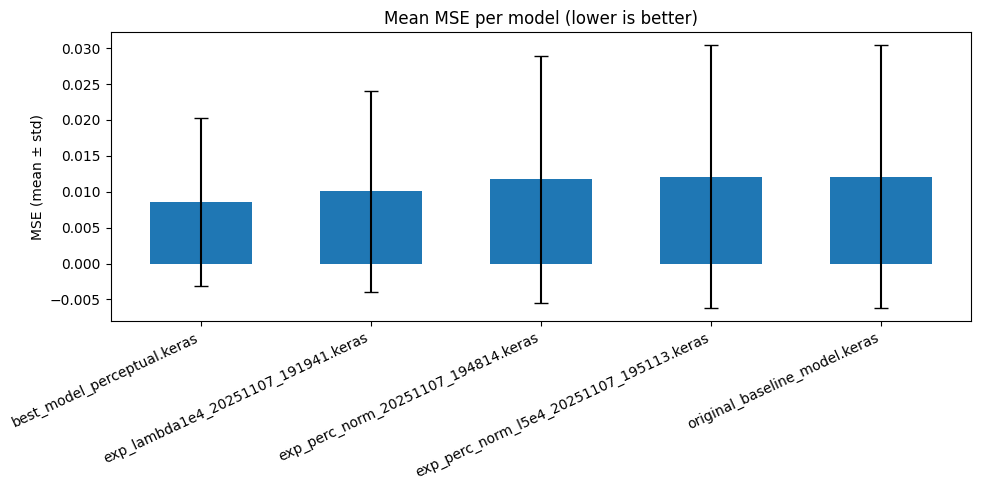

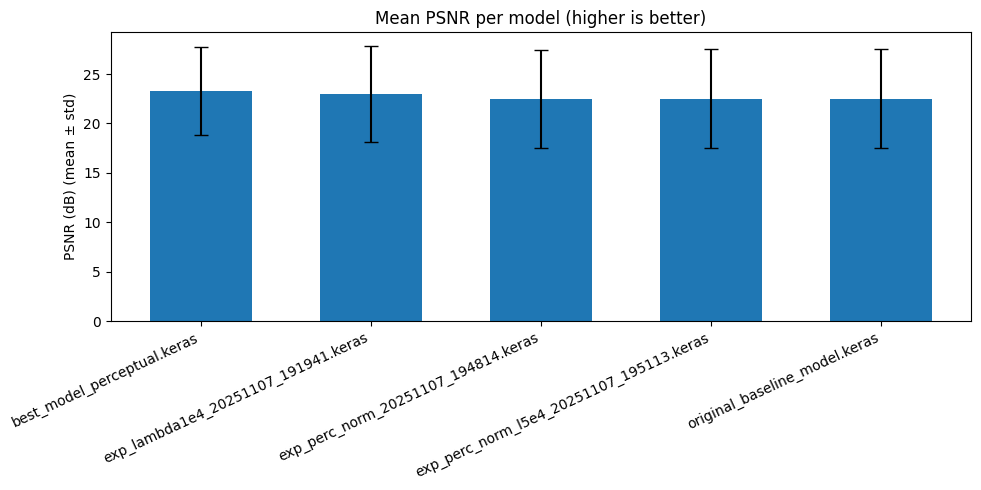

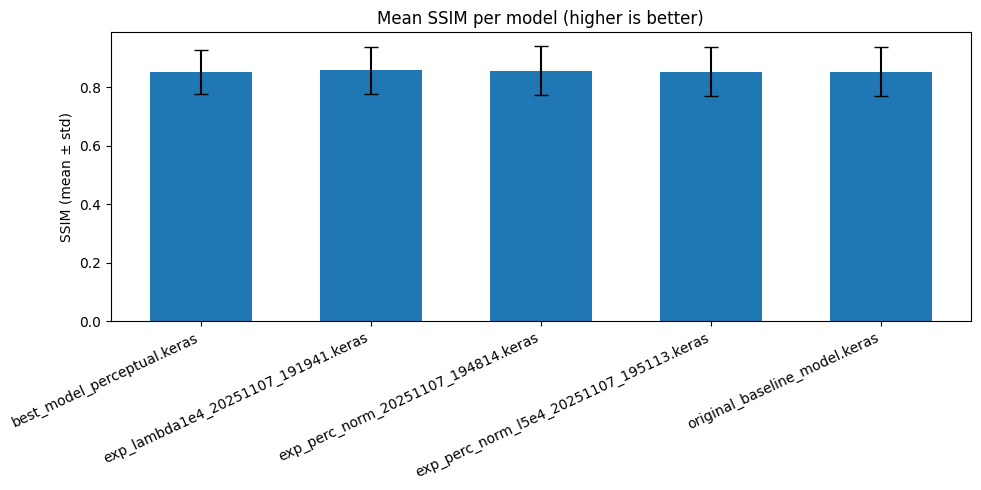

/tmp/ipykernel_2756424/3620116235.py:135: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([results_per_model[m]['psnr'] for m in labels], labels=labels, showfliers=True)
/tmp/ipykernel_2756424/3620116235.py:140: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([results_per_model[m]['ssim'] for m in labels], labels=labels, showfliers=True)


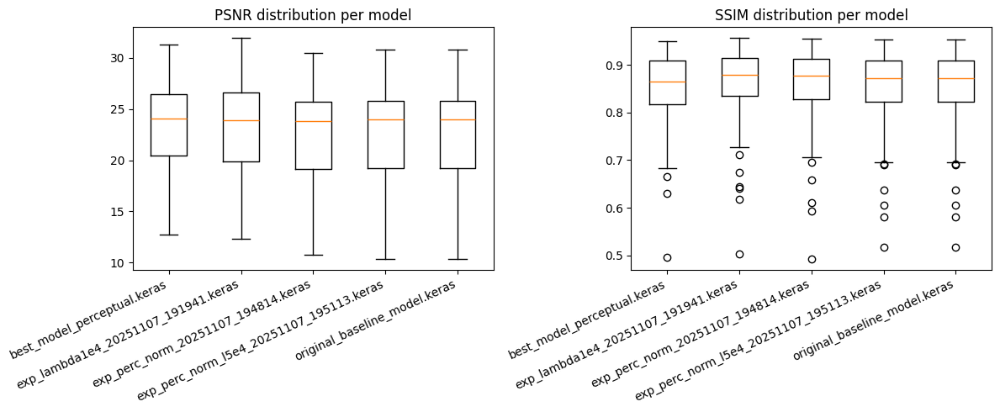

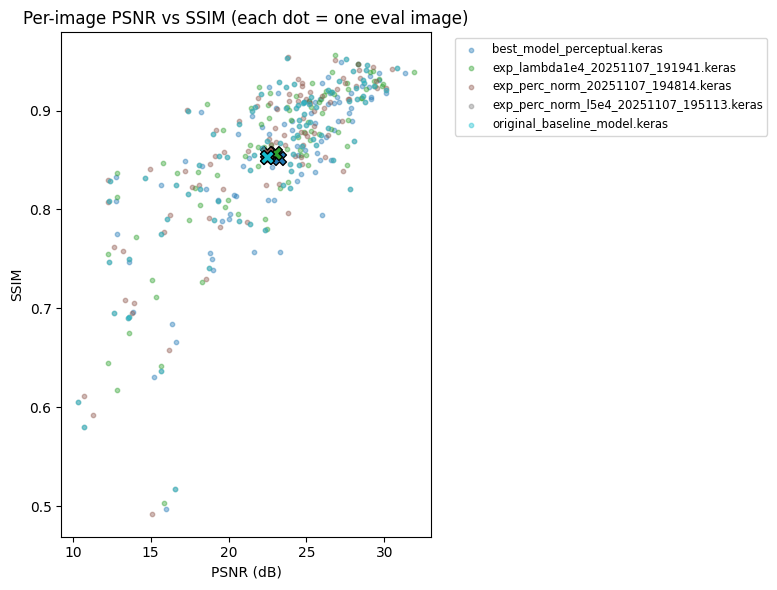

All plots saved to: /home/hp/Downloads/All_Old_Folders/CV/Projects/Enhanced_ELIEI/training_runs/plots


In [37]:
# Plot comparison graphs for all models (bar + box + scatter)
import os, glob, numpy as np, matplotlib.pyplot as plt, random, csv
import tensorflow as tf
from tensorflow.keras.models import load_model
from PIL import Image
from collections import defaultdict

# ---- Paths (adjust if needed) ----
runs_dir = "/home/hp/Downloads/All_Old_Folders/CV/Projects/Enhanced_ELIEI/training_runs"
eval_low_dir = "/home/hp/Downloads/All_Old_Folders/CV/Projects/Enhanced_ELIEI/data_root/eval/low"
eval_high_dir = "/home/hp/Downloads/All_Old_Folders/CV/Projects/Enhanced_ELIEI/data_root/eval/high"
out_plots_dir = os.path.join(runs_dir, "plots")
os.makedirs(out_plots_dir, exist_ok=True)

# ---- Load eval pairs ----
def load_rgb(path, size=(256,256)):
    img = Image.open(path).convert('RGB').resize(size)
    return np.array(img).astype(np.float32)/255.0

names = sorted([f for f in os.listdir(eval_low_dir) if os.path.isfile(os.path.join(eval_low_dir, f))])
X = []
Y = []
valid_names = []
for n in names:
    p1 = os.path.join(eval_low_dir, n)
    p2 = os.path.join(eval_high_dir, n)
    if os.path.exists(p2):
        X.append(load_rgb(p1))
        Y.append(load_rgb(p2))
        valid_names.append(n)
X = np.array(X, dtype=np.float32)
Y = np.array(Y, dtype=np.float32)
N = len(X)
print(f"Loaded {N} eval images.")

# ---- Find models (.keras files recursively) ----
model_files = sorted(glob.glob(os.path.join(runs_dir, "**", "*.keras"), recursive=True))
# If there are duplicates or unrelated .keras files you can filter names here.
print("Models found:", model_files)

# ---- Helpers: per-image metrics ----
def per_image_mse(a,b):
    return np.mean((a - b)**2, axis=(1,2,3))  # shape (N,)
def per_image_psnr(a,b):
    # returns per-image PSNR using TF op (vectorized)
    vals = tf.image.psnr(a, b, max_val=1.0)
    return vals.numpy().astype(float)  # shape (N,)
def per_image_ssim(a,b):
    vals = tf.image.ssim(a, b, max_val=1.0)
    return vals.numpy().astype(float)

# ---- Evaluate each model and collect metrics ----
results_per_model = {}   # model_name -> dict of arrays
for mf in model_files:
    try:
        print("Evaluating:", mf)
        model = load_model(mf, compile=False)
        preds = model.predict(X, batch_size=4, verbose=0)
        preds = np.clip(preds, 0.0, 1.0)
        mse_arr = per_image_mse(preds, Y)
        psnr_arr = per_image_psnr(preds, Y)
        ssim_arr = per_image_ssim(preds, Y)
        results_per_model[os.path.basename(mf)] = {
            "mse": mse_arr,
            "psnr": psnr_arr,
            "ssim": ssim_arr
        }
        print(f"  -> mean MSE {mse_arr.mean():.6f}, PSNR {psnr_arr.mean():.2f}, SSIM {ssim_arr.mean():.4f}")
    except Exception as e:
        print("  Error loading/evaluating", mf, ":", e)

# ---- Save per-image CSV for record ----
csv_path = os.path.join(out_plots_dir, "per_image_metrics_all_models.csv")
with open(csv_path, "w", newline="") as f:
    writer = csv.writer(f)
    # header: name, then for each model three columns name_mse,name_psnr,name_ssim
    models = list(results_per_model.keys())
    header = ["image_name"]
    for m in models:
        header += [f"{m}_mse", f"{m}_psnr", f"{m}_ssim"]
    writer.writerow(header)
    for i, img_name in enumerate(valid_names):
        row = [img_name]
        for m in models:
            row += [
                f"{results_per_model[m]['mse'][i]:.8f}",
                f"{results_per_model[m]['psnr'][i]:.6f}",
                f"{results_per_model[m]['ssim'][i]:.6f}"
            ]
        writer.writerow(row)
print("Saved per-image metrics CSV to:", csv_path)

# ---- Plot: Bar chart of mean ± std for MSE, PSNR, SSIM ----
labels = models
means_mse = [results_per_model[m]['mse'].mean() for m in labels]
stds_mse  = [results_per_model[m]['mse'].std()  for m in labels]
means_psnr = [results_per_model[m]['psnr'].mean() for m in labels]
stds_psnr  = [results_per_model[m]['psnr'].std()  for m in labels]
means_ssim = [results_per_model[m]['ssim'].mean() for m in labels]
stds_ssim  = [results_per_model[m]['ssim'].std()  for m in labels]

x = np.arange(len(labels))
w = 0.6

plt.figure(figsize=(10,5))
plt.bar(x, means_mse, yerr=stds_mse, capsize=5, width=w)
plt.xticks(x, labels, rotation=25, ha='right')
plt.ylabel("MSE (mean ± std)")
plt.title("Mean MSE per model (lower is better)")
plt.tight_layout()
plt.savefig(os.path.join(out_plots_dir, "bar_mse.png"), dpi=200)
plt.show()

plt.figure(figsize=(10,5))
plt.bar(x, means_psnr, yerr=stds_psnr, capsize=5, width=w)
plt.xticks(x, labels, rotation=25, ha='right')
plt.ylabel("PSNR (dB) (mean ± std)")
plt.title("Mean PSNR per model (higher is better)")
plt.tight_layout()
plt.savefig(os.path.join(out_plots_dir, "bar_psnr.png"), dpi=200)
plt.show()

plt.figure(figsize=(10,5))
plt.bar(x, means_ssim, yerr=stds_ssim, capsize=5, width=w)
plt.xticks(x, labels, rotation=25, ha='right')
plt.ylabel("SSIM (mean ± std)")
plt.title("Mean SSIM per model (higher is better)")
plt.tight_layout()
plt.savefig(os.path.join(out_plots_dir, "bar_ssim.png"), dpi=200)
plt.show()

# ---- Plot: boxplots for PSNR and SSIM to show distribution ----
plt.figure(figsize=(12,5))
plt.subplot(1,2,1)
plt.boxplot([results_per_model[m]['psnr'] for m in labels], labels=labels, showfliers=True)
plt.title("PSNR distribution per model")
plt.xticks(rotation=25, ha='right')

plt.subplot(1,2,2)
plt.boxplot([results_per_model[m]['ssim'] for m in labels], labels=labels, showfliers=True)
plt.title("SSIM distribution per model")
plt.xticks(rotation=25, ha='right')

plt.tight_layout()
plt.savefig(os.path.join(out_plots_dir, "box_psnr_ssim.png"), dpi=200)
plt.show()

# ---- Plot: PSNR vs SSIM scatter (per-image), color-coded by model mean position ----
plt.figure(figsize=(8,6))
colors = plt.cm.tab10(np.linspace(0,1,len(labels)))
for i, m in enumerate(labels):
    ps = results_per_model[m]['psnr']
    ss = results_per_model[m]['ssim']
    plt.scatter(ps, ss, alpha=0.4, color=colors[i], label=m, s=10)
    # also plot mean marker
    plt.scatter([ps.mean()], [ss.mean()], color=colors[i], edgecolor='k', s=100, marker='X')

plt.xlabel("PSNR (dB)")
plt.ylabel("SSIM")
plt.title("Per-image PSNR vs SSIM (each dot = one eval image)")
plt.legend(fontsize='small', bbox_to_anchor=(1.05,1))
plt.tight_layout()
plt.savefig(os.path.join(out_plots_dir, "psnr_vs_ssim_scatter.png"), dpi=200)
plt.show()

print("All plots saved to:", out_plots_dir)


Loading Original (No VGG) ...
 -> saved: /home/hp/Downloads/All_Old_Folders/CV/Projects/Enhanced_ELIEI/inference_results/Original_(No_VGG)_Test1.png
Loading best_model_perceptual ...
 -> saved: /home/hp/Downloads/All_Old_Folders/CV/Projects/Enhanced_ELIEI/inference_results/best_model_perceptual_Test1.png
Loading exp_lambda1e4 ...
 -> saved: /home/hp/Downloads/All_Old_Folders/CV/Projects/Enhanced_ELIEI/inference_results/exp_lambda1e4_Test1.png
Loading exp_perc_norm ...
 -> saved: /home/hp/Downloads/All_Old_Folders/CV/Projects/Enhanced_ELIEI/inference_results/exp_perc_norm_Test1.png
Loading exp_perc_norm_l5e4 ...
 -> saved: /home/hp/Downloads/All_Old_Folders/CV/Projects/Enhanced_ELIEI/inference_results/exp_perc_norm_l5e4_Test1.png

Metrics against GT:
Model		MSE		PSNR(dB)	SSIM
Original (No VGG)	0.128679	8.905		0.3962
best_model_perceptual	0.118373	9.267		0.4049
exp_lambda1e4	0.122736	9.110		0.4031
exp_perc_norm	0.125974	8.997		0.4009
exp_perc_norm_l5e4	0.128679	8.905		0.3962


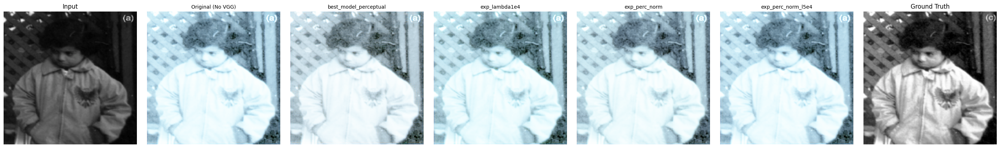


All outputs saved under: /home/hp/Downloads/All_Old_Folders/CV/Projects/Enhanced_ELIEI/inference_results


In [38]:
import os
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.models import load_model

# ---------- User paths ----------
test_image_path = '/home/hp/Downloads/All_Old_Folders/CV/Projects/Enhanced_ELIEI/data_root/test/low/Test_1.png'
gt_image_path   = '/home/hp/Downloads/All_Old_Folders/CV/Projects/Enhanced_ELIEI/data_root/test/high/Test_1.png'  # optional; set to None if no GT
save_dir = "/home/hp/Downloads/All_Old_Folders/CV/Projects/Enhanced_ELIEI/inference_results"
os.makedirs(save_dir, exist_ok=True)

# ---------- Model list (update paths if needed) ----------
model_info = {
    "Original (No VGG)": "/home/hp/Downloads/All_Old_Folders/CV/Projects/Enhanced_ELIEI/training_runs/original_baseline_model.keras",
    "best_model_perceptual": "/home/hp/Downloads/All_Old_Folders/CV/Projects/Enhanced_ELIEI/training_runs/best_model_perceptual.keras",
    "exp_lambda1e4": "/home/hp/Downloads/All_Old_Folders/CV/Projects/Enhanced_ELIEI/training_runs/exp_lambda1e4_20251107_191941.keras",
    "exp_perc_norm": "/home/hp/Downloads/All_Old_Folders/CV/Projects/Enhanced_ELIEI/training_runs/exp_perc_norm_20251107_194814.keras",
    "exp_perc_norm_l5e4": "/home/hp/Downloads/All_Old_Folders/CV/Projects/Enhanced_ELIEI/training_runs/exp_perc_norm_l5e4_20251107_195113.keras"
}

# ---------- Helper functions ----------
def load_rgb(path, size=(256,256)):
    img = Image.open(path).convert('RGB').resize(size)
    arr = np.array(img).astype(np.float32) / 255.0
    return arr

def save_rgb(arr, path):
    arr_uint8 = (np.clip(arr,0,1) * 255).astype(np.uint8)
    Image.fromarray(arr_uint8).save(path)

def compute_metrics(pred, gt):
    # pred, gt are float arrays in [0,1], shape HWC
    psnr = float(tf.image.psnr(pred, gt, max_val=1.0).numpy())
    ssim = float(tf.image.ssim(pred, gt, max_val=1.0).numpy())
    mse  = float(np.mean((pred - gt)**2))
    return mse, psnr, ssim

# ---------- Load images ----------
inp = load_rgb(test_image_path)   # 256x256x3
has_gt = os.path.exists(gt_image_path)
if has_gt:
    gt = load_rgb(gt_image_path)
else:
    gt = None

# ---------- Predict with each available model ----------
results = {}  # name -> output array
metrics = {}  # name -> (mse, psnr, ssim) if gt present

for name, mpath in model_info.items():
    if not os.path.exists(mpath):
        print(f"[WARN] Model not found, skipping: {mpath}")
        continue
    try:
        print(f"Loading {name} ...")
        model = load_model(mpath, compile=False)
        inp_batch = np.expand_dims(inp, 0)  # 1,H,W,3
        pred = model.predict(inp_batch, verbose=0)[0]
        pred = np.clip(pred, 0.0, 1.0)
        results[name] = pred
        out_path = os.path.join(save_dir, f"{name.replace(' ', '_')}_Test1.png")
        save_rgb(pred, out_path)
        print(f" -> saved: {out_path}")
        if has_gt:
            metrics[name] = compute_metrics(pred, gt)
    except Exception as e:
        print(f"[ERROR] Failed {name}: {e}")

# ---------- Also save input and GT (if any) ----------
input_save = os.path.join(save_dir, "input_Test1.png")
save_rgb(inp, input_save)
if has_gt:
    save_rgb(gt, os.path.join(save_dir, "gt_Test1.png"))

# ---------- Print metrics ----------
if has_gt and metrics:
    print("\nMetrics against GT:")
    print("Model\t\tMSE\t\tPSNR(dB)\tSSIM")
    for name, (mse, psnr, ssim) in metrics.items():
        print(f"{name}\t{mse:.6f}\t{psnr:.3f}\t\t{ssim:.4f}")

# ---------- Display a side-by-side figure ----------
n_models = len(results)
ncols = n_models + 2  # input + models + GT (if present)
plt.figure(figsize=(4*ncols, 4))

# show input
plt.subplot(1, ncols, 1)
plt.imshow(inp); plt.title("Input"); plt.axis('off')

# show each model
i = 2
for name, pred in results.items():
    plt.subplot(1, ncols, i)
    plt.imshow(pred); plt.title(name, fontsize=10); plt.axis('off')
    i += 1

# show GT if present
if has_gt:
    plt.subplot(1, ncols, ncols)
    plt.imshow(gt); plt.title("Ground Truth"); plt.axis('off')

plt.tight_layout()
plt.show()

print("\nAll outputs saved under:", save_dir)


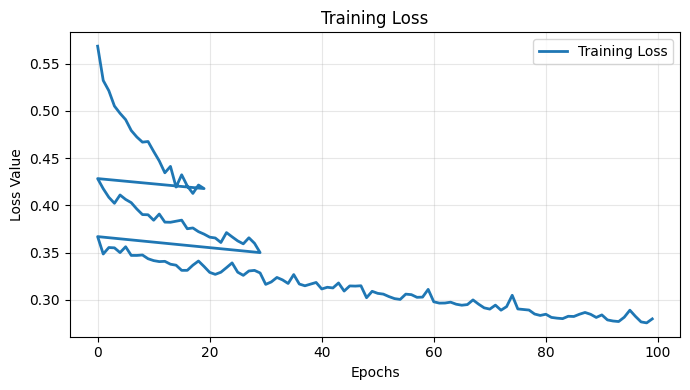

In [48]:
import pandas as pd
import matplotlib.pyplot as plt

# Load log
log = pd.read_csv('/home/hp/Downloads/All_Old_Folders/CV/Projects/Enhanced_ELIEI/training_runs/training_log.csv')

plt.figure(figsize=(7, 4))

# Plot training & validation loss
plt.plot(log['epoch'], log['loss'], label='Training Loss', linewidth=2)
# plt.plot(log['epoch'], log['val_loss'], label='Validation Loss', linewidth=2, linestyle='--')

plt.title("Training Loss")
plt.xlabel("Epochs")
plt.ylabel("Loss Value")
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
plt.savefig('training_log_plot.png', dpi=300)
plt.show()


 

In [51]:
# 🧠 Full Fresh Training of the Best Architecture (500 Epochs with Validation)

import os
import datetime
import tensorflow as tf
from tensorflow.keras.models import load_model
from tensorflow.keras.callbacks import ModelCheckpoint, CSVLogger
from tensorflow.keras import backend as K

# -----------------------------------------------------------
# 🧩 Custom Metric Fixes
# -----------------------------------------------------------
from tensorflow.image import psnr as tf_psnr
from tensorflow.image import ssim as tf_ssim

def psnr_metric(y_true, y_pred):
    y_true = tf.clip_by_value(y_true, 0.0, 1.0)
    y_pred = tf.clip_by_value(y_pred, 0.0, 1.0)
    return tf.reduce_mean(tf_psnr(y_true, y_pred, max_val=1.0))

def ssim_metric(y_true, y_pred):
    y_true = tf.clip_by_value(y_true, 0.0, 1.0)
    y_pred = tf.clip_by_value(y_pred, 0.0, 1.0)
    return tf.reduce_mean(tf_ssim(y_true, y_pred, max_val=1.0))

# -----------------------------------------------------------
# 🏗️ Load Base Model Architecture (no weights)
# -----------------------------------------------------------
best_model_path = "/home/hp/Downloads/All_Old_Folders/CV/Projects/Enhanced_ELIEI/training_runs/best_model_perceptual.keras"
base_output_dir = "/home/hp/Downloads/All_Old_Folders/CV/Projects/Enhanced_ELIEI/training_runs"

print("Loading model architecture...")
model = load_model(best_model_path, compile=False)

# ✅ Properly reset all weights to random initial state
for layer in model.layers:
    if hasattr(layer, 'kernel_initializer'):
        new_weights = [init(w.shape, dtype=w.dtype) 
                       for w, init in zip(layer.get_weights(), 
                                          [layer.kernel_initializer if hasattr(layer, 'kernel_initializer') else None 
                                           for _ in layer.get_weights()])]
        if new_weights:
            layer.set_weights(new_weights)
print("✅ Model architecture loaded and reinitialized successfully.")

# -----------------------------------------------------------
# ⚙️ Recompile Model
# -----------------------------------------------------------
model.compile(
    optimizer='adam',
    loss=combined_loss,     # your combined (MSE + perceptual) loss
    metrics=['mse', psnr_metric, ssim_metric]
)

# -----------------------------------------------------------
# 🗂️ Create New Output Folder for this Run
# -----------------------------------------------------------
ts = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")
run_dir = os.path.join(base_output_dir, f"fresh_training_{ts}")
os.makedirs(run_dir, exist_ok=True)

checkpoint_path = os.path.join(run_dir, "best_model_fresh.keras")
log_path = os.path.join(run_dir, "training_log.csv")

checkpoint_cb = ModelCheckpoint(
    checkpoint_path, monitor='val_loss', save_best_only=True, verbose=1
)
csv_logger = CSVLogger(log_path, append=False)

# -----------------------------------------------------------
# 🚀 Start Full 500-Epoch Training
# -----------------------------------------------------------
history_new = model.fit(
    low_light_array,
    enhanced_array,
    epochs=500,              # 🔥 Full 500 epochs
    batch_size=4,
    validation_split=0.1,    # 10% validation
    callbacks=[checkpoint_cb, csv_logger],
    verbose=1
)

print("\n✅ Fresh 500-epoch training completed successfully!")
print(f"📁 Best model saved to: {checkpoint_path}")
print(f"🧾 Training log saved to: {log_path}")


Loading model architecture...
✅ Model architecture loaded and reinitialized successfully.
Epoch 1/500
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 2.8486 - mse: 0.0970 - psnr_metric: 10.4700 - ssim_metric: 0.2956
Epoch 1: val_loss improved from None to 2.35917, saving model to /home/hp/Downloads/All_Old_Folders/CV/Projects/Enhanced_ELIEI/training_runs/fresh_training_20251109_132019/best_model_fresh.keras
53/53 ━━━━━━━━━━━━━━━━━━━━ 9s 106ms/step - loss: 2.7115 - mse: 0.1107 - psnr_metric: 9.8820 - ssim_metric: 0.2417 - val_loss: 2.3592 - val_mse: 0.1007 - val_psnr_metric: 10.2027 - val_ssim_metric: 0.1628
Epoch 2/500
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 2.2372 - mse: 0.1040 - psnr_metric: 10.1766 - ssim_metric: 0.1846
Epoch 2: val_loss improved from 2.35917 to 1.62209, saving model to /home/hp/Downloads/All_Old_Folders/CV/Projects/Enhanced_ELIEI/training_runs/fresh_training_20251109_132019/best_model_fresh.keras
53/53 ━━━━━━━━━━━━━━━━━━━━ 5s 91ms/step - loss: 2.0642 - mse:

Columns: ['epoch', 'loss', 'mse', 'psnr_metric', 'ssim_metric', 'val_loss', 'val_mse', 'val_psnr_metric', 'val_ssim_metric']


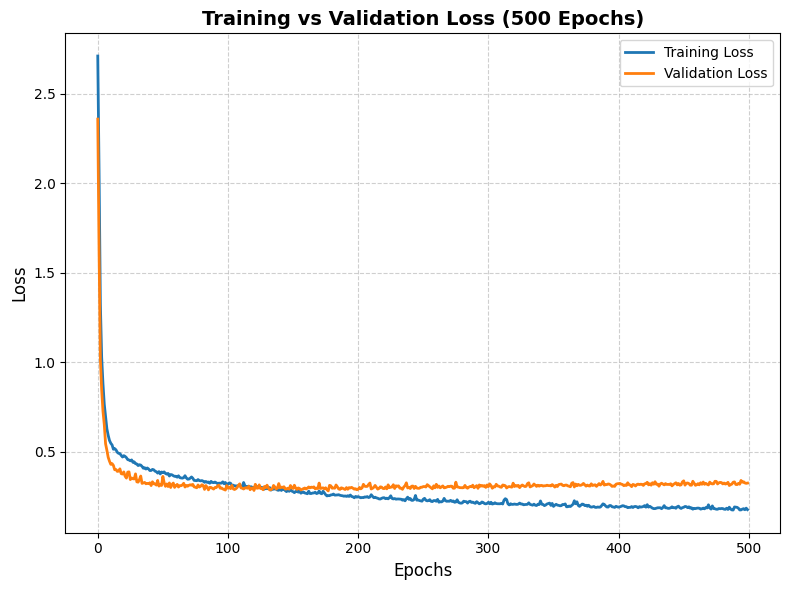

In [52]:
# --- Plot Training vs Validation Loss ---
import pandas as pd
import matplotlib.pyplot as plt

# Path to your latest training log file
log_path = "/home/hp/Downloads/All_Old_Folders/CV/Projects/Enhanced_ELIEI/training_runs/fresh_training_20251109_132019/training_log.csv"

# Load log data
history_df = pd.read_csv(log_path)

# Print available columns to confirm structure
print("Columns:", history_df.columns.tolist())

# Plot Training vs Validation Loss
plt.figure(figsize=(8,6))
plt.plot(history_df["epoch"], history_df["loss"], label="Training Loss", linewidth=2)
plt.plot(history_df["epoch"], history_df["val_loss"], label="Validation Loss", linewidth=2)
plt.xlabel("Epochs", fontsize=12)
plt.ylabel("Loss", fontsize=12)
plt.title("Training vs Validation Loss (500 Epochs)", fontsize=14, fontweight='bold')
plt.legend()
plt.grid(True, linestyle="--", alpha=0.6)
plt.tight_layout()
plt.show()


In [54]:
# 🧠 Full Fresh Training of the Best Architecture (500 Epochs with Validation)

import os
import datetime
import tensorflow as tf
from tensorflow.keras.models import load_model
from tensorflow.keras.callbacks import ModelCheckpoint, CSVLogger
from tensorflow.keras import backend as K

# -----------------------------------------------------------
# 🧩 Custom Metric Fixes
# -----------------------------------------------------------
from tensorflow.image import psnr as tf_psnr
from tensorflow.image import ssim as tf_ssim

def psnr_metric(y_true, y_pred):
    y_true = tf.clip_by_value(y_true, 0.0, 1.0)
    y_pred = tf.clip_by_value(y_pred, 0.0, 1.0)
    return tf.reduce_mean(tf_psnr(y_true, y_pred, max_val=1.0))

def ssim_metric(y_true, y_pred):
    y_true = tf.clip_by_value(y_true, 0.0, 1.0)
    y_pred = tf.clip_by_value(y_pred, 0.0, 1.0)
    return tf.reduce_mean(tf_ssim(y_true, y_pred, max_val=1.0))

# -----------------------------------------------------------
# 🏗️ Load Base Model Architecture (no weights)
# -----------------------------------------------------------
best_model_path = "/home/hp/Downloads/All_Old_Folders/CV/Projects/Enhanced_ELIEI/training_runs/best_model_perceptual.keras"
base_output_dir = "/home/hp/Downloads/All_Old_Folders/CV/Projects/Enhanced_ELIEI/training_runs"

print("Loading model architecture...")
model = load_model(best_model_path, compile=False)

# ✅ Properly reset all weights to random initial state
for layer in model.layers:
    if hasattr(layer, 'kernel_initializer'):
        new_weights = [init(w.shape, dtype=w.dtype) 
                       for w, init in zip(layer.get_weights(), 
                                          [layer.kernel_initializer if hasattr(layer, 'kernel_initializer') else None 
                                           for _ in layer.get_weights()])]
        if new_weights:
            layer.set_weights(new_weights)
print("✅ Model architecture loaded and reinitialized successfully.")

# -----------------------------------------------------------
# ⚙️ Recompile Model
# -----------------------------------------------------------
model.compile(
    optimizer='adam',
    loss=combined_loss,     # your combined (MSE + perceptual) loss
    metrics=['mse', psnr_metric, ssim_metric]
)

# -----------------------------------------------------------
# 🗂️ Create New Output Folder for this Run
# -----------------------------------------------------------
ts = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")
run_dir = os.path.join(base_output_dir, f"fresh_training_2_{ts}")
os.makedirs(run_dir, exist_ok=True)

checkpoint_path = os.path.join(run_dir, "best_model_fresh.keras")
log_path = os.path.join(run_dir, "training_log.csv")

checkpoint_cb = ModelCheckpoint(
    checkpoint_path, monitor='val_loss', save_best_only=True, verbose=1
)
csv_logger = CSVLogger(log_path, append=False)

# -----------------------------------------------------------
# 🚀 Start Full 5000-Epoch Training
# -----------------------------------------------------------
history_new = model.fit(
    low_light_array,
    enhanced_array,
    epochs=5000,              # 🔥 Full 5000 epochs
    batch_size=4,
    validation_split=0.25,    # 25% validation
    callbacks=[checkpoint_cb, csv_logger],
    verbose=1
)

print("\n✅ Fresh 500-epoch training completed successfully!")
print(f"📁 Best model saved to: {checkpoint_path}")
print(f"🧾 Training log saved to: {log_path}")


Loading model architecture...
✅ Model architecture loaded and reinitialized successfully.
Epoch 1/5000
45/45 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - loss: 3.0425 - mse: 0.0974 - psnr_metric: 10.4980 - ssim_metric: 0.3909
Epoch 1: val_loss improved from None to 1.81916, saving model to /home/hp/Downloads/All_Old_Folders/CV/Projects/Enhanced_ELIEI/training_runs/fresh_training_2_20251110_003040/best_model_fresh.keras
45/45 ━━━━━━━━━━━━━━━━━━━━ 10s 158ms/step - loss: 2.4337 - mse: 0.0752 - psnr_metric: 12.1385 - ssim_metric: 0.4895 - val_loss: 1.8192 - val_mse: 0.0251 - val_psnr_metric: 16.8159 - val_ssim_metric: 0.5892
Epoch 2/5000
44/45 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 1.5368 - mse: 0.0266 - psnr_metric: 16.8241 - ssim_metric: 0.6581
Epoch 2: val_loss improved from 1.81916 to 1.24214, saving model to /home/hp/Downloads/All_Old_Folders/CV/Projects/Enhanced_ELIEI/training_runs/fresh_training_2_20251110_003040/best_model_fresh.keras
45/45 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 1.36

In [ ]:
# --- Plot Training vs Validation Loss ---
import pandas as pd
import matplotlib.pyplot as plt

# Path to your latest training log file
log_path = "/home/hp/Downloads/All_Old_Folders/CV/Projects/Enhanced_ELIEI/training_runs/fresh_training_2_20251110_003040/training_log.csv"

# Load log data
history_df = pd.read_csv(log_path)

# Print available columns to confirm structure
print("Columns:", history_df.columns.tolist())

# Plot Training vs Validation Loss
plt.figure(figsize=(8,6))
plt.plot(history_df["epoch"], history_df["loss"], label="Training Loss", linewidth=2)
plt.plot(history_df["epoch"], history_df["val_loss"], label="Validation Loss", linewidth=2)
plt.xlabel("Epochs", fontsize=12)
plt.ylabel("Loss", fontsize=12)
plt.title("Training vs Validation Loss (500 Epochs)", fontsize=14, fontweight='bold')
plt.legend()
plt.grid(True, linestyle="--", alpha=0.6)
plt.tight_layout()
plt.show()
